Presentation du Jeu de Données :

- Source et origine des données : 
Le jeu de données est intitulé "Domiciliation des agents - Bilan social" et est publié sur la plateforme Open Data Paris.
Ces données proviennent du bilan social des agents de la Ville de Paris et portent sur leur lieu de résidence.

Nombre d'observations et de variables : 
- nombre de lignes : 237 688
- nombre de colonnes : 11

Types et significations des variables avant modification de la base de données : 
- "Date" : entier (int64), corresponds à l'année du bilan social.
- "Collective" : objet (object), designe la collectivité à laquelle les agents sont rattachés.
- "Sexe" : objet (object), designe les genres des agents (masculin, féminin).
- "Direction" : objet (object), corresponds à l'affectation de l'agent.
- "Catégorie" : objet (object), ce sont les status des agents (A, B, C).
- "Filière" : Object, le domaine de l'agent aka son service.
- "Zone" : Object, il s'agit de la zone géographique de domicialition.
- "Code" : Object, code postale de la ville de domiciliation. 
- "Ville" : Object, nom de la ville.
- "Agent" : Nombre décimal (float64), c'est le nombre d'agent dans cette combinaison de critères.
- "Coordonnées_xy_code_postal" : objet (object), ce sont les coordonnées géographiques (latitude, longitude) du code postal.

Nombre de valeurs manquantes par variable : 
Filière : 40 702
Collectivite : 36 278
Ville : 19 108
Direction : 13 896
Coordonnées : 2 795
Catégorie : 1 374
Code postal : 90
Les autres variables ne contiennent aucune valeur manquante.

Autres éléments descriptifs pertinents : 
- Le jeu de données est agrégé par année, collectivité, les caractéristique de l'agent, le lieu de domiciliation, le nombre d'agent. 
- Historique : on voit une périodicité avec les années, ce qui permet des analyses temporelles. 
- Les adresses : les colonnes "code postal" et "coordonnées_xy_code_postal" nécessite une attention particulière pour le nettoyage et la conversion en types numériques.

Importation des Librairies

In [258]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import os
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import sys
import subprocess


Chargement du Fichier Csv

In [202]:
file_path = "domiciliation-des-agents-bilan-social.csv"

#Chargement de DataFrame : nous vérifions que la base de données ait bien été importée.
try : 
    df = pd.read_csv(file_path, sep=';')
    print(f"Le fichier '{file_path}' a été chargé avec succès")
except FileNotFoundError :
    print(f"Le fichier '{file_path}' est introuvable. Vérifier le dossier")
    df = pd.DataFrame()

Le fichier 'domiciliation-des-agents-bilan-social.csv' a été chargé avec succès


Structure et Description du Jeu de Données :
Les types de données manquantes : On vérifie les types de données (`dtypes`) et on calcule le nombre de valeurs manquantes (`NaN`) par colonne.

Types de données

In [203]:
# Afficher le nombre de lignes et de colonnes 
nombre_lignes, nombre_colonnes = df.shape
print(f"Nombre de lignes : {nombre_lignes}")
print(f"Nombre de colonnes : {nombre_colonnes}")

#Afficher les types de données de chaque colonne
print("Types de données par variable:")
print(df.dtypes)

Nombre de lignes : 237688
Nombre de colonnes : 11
Types de données par variable:
DATE                            int64
COLLECTIVITE                   object
SEXE                           object
DIRECTION                      object
CATEGORIE                      object
FILIERE                        object
ZONE                           object
CODE POSTAL                    object
VILLE                          object
AGENT                         float64
coordonnees_xy_code_postal     object
dtype: object


Données manquantes

In [204]:
# Calcul du nombre de valeurs manquantes par variable
missing_values = df.isnull().sum()
missing_percentage = (df.isnull().sum() / len(df)) * 100
missing_summary = pd.DataFrame({
    'Valeurs Manquantes (N)': missing_values,
    'Pourcentage Manquant (%)': missing_percentage.round(2)
})
print("--- Tableau des valeurs manquantes par variable ---")
print(missing_summary[missing_summary['Valeurs Manquantes (N)'] > 0].sort_values(by='Pourcentage Manquant (%)', ascending=False).to_markdown(numalign="left", stralign="left"))

--- Tableau des valeurs manquantes par variable ---
|                            | Valeurs Manquantes (N)   | Pourcentage Manquant (%)   |
|:---------------------------|:-------------------------|:---------------------------|
| FILIERE                    | 40702                    | 17.12                      |
| COLLECTIVITE               | 36278                    | 15.26                      |
| VILLE                      | 19108                    | 8.04                       |
| DIRECTION                  | 13896                    | 5.85                       |
| coordonnees_xy_code_postal | 2795                     | 1.18                       |
| CATEGORIE                  | 1374                     | 0.58                       |
| CODE POSTAL                | 90                       | 0.04                       |


Conversion et Nettoyage des Données pour Une Meilleure Performance et Creation de Nouvelles Variables

Conversion d'une variable type float en entier. Mais avant cela, nous Vérifions que la colonne "AGENT" contient des valeurs non entières.

In [205]:
# On vérifie si le modulo 1 de la valeur est différent de 0, ce qui indique une partie décimale
decimal_agents = df[df['AGENT'].notnull() & (df['AGENT'] % 1 != 0)]

if not decimal_agents.empty:
    print("\n--- Statistiques de la colonne 'AGENT' (Contient des valeurs décimales) ---")
    print(df['AGENT'].describe().to_markdown(numalign="left", stralign="left"))
    # Affichage de quelques exemples de valeurs décimales
    print("\nQuelques exemples de valeurs décimales dans 'AGENT' :")
    print(decimal_agents['AGENT'].head().to_markdown(numalign="left", stralign="left"))
else:
    print("\nLa colonne 'AGENT' ne contient pas de valeurs décimales (sauf NaN, déjà exclues). Conversion en 'int64' possible.")
    # Puisque AGENT n'a pas de NaNs, on peut convertir
    df['AGENT'] = df['AGENT'].astype('int64')
    print("Colonne 'AGENT' convertie en `int64`.")
    print("\n--- Statistiques de la colonne 'AGENT' (Après conversion) ---")
    print(df['AGENT'].describe().to_markdown(numalign="left", stralign="left"))


La colonne 'AGENT' ne contient pas de valeurs décimales (sauf NaN, déjà exclues). Conversion en 'int64' possible.
Colonne 'AGENT' convertie en `int64`.

--- Statistiques de la colonne 'AGENT' (Après conversion) ---
|       | AGENT   |
|:------|:--------|
| count | 237688  |
| mean  | 2.5549  |
| std   | 8.0234  |
| min   | 1       |
| 25%   | 1       |
| 50%   | 1       |
| 75%   | 2       |
| max   | 448     |


Explication et Interprétation des valeurs ici : 
- Count représente le nombre total d'observations (lignes) dans notre jeu de données. 
Cela confirme qu'il n'y a aucune valeur manquante dans cette colonne.
- Mean corresponds à la moyenne du nombre d'agents par ligne. En moyenne, chaque ligne d'entrée (chaque combinaison unique de date, sexe, catégorie, ville, etc.) représente environ 2.55 agents.
- Std mesure de la dispersion des données autour de la moyenne. Un écart-type élevé (8.02) par rapport à la moyenne (2.55) indique que le nombre d'agents par ligne est très variable. Certaines lignes représentent beaucoup d'agents, et d'autres très peu.
- Min corresponds à la valeur minimale. La plus petite agrégation possible est 1 agent, ce qui est logique pour un comptage d'effectifs.
- Le premier quartile des lignes du DataFrame représentent 1 agent.
- La médiane corresponds à des lignes du DataFrame (la moitié) représentent 1 agent. Le fait que la médiane soit égale au minimum indique que la grande majorité des lignes sont très granulaires.
- Le troisième quartile corresponds à des lignes du DataFrame représentent 2 agents ou moins. Inversement, seulement 25% des lignes représentent 3 agents ou plus.
- Max représente la ligne la plus agrégée de notre jeu de données (448 agents). 

Gestion des valeurs manquantes dans les colonnes catégorielles : 
Nous remplacerons les valeurs manquantes "NaN" par "Non renseigné" dans tous les champs. Dans un premier temps, nous le ferons pour les variables types "object". 

In [206]:
categorical_cols_to_fill = ['COLLECTIVITE', 'DIRECTION', 'CATEGORIE', 'FILIERE']
df[categorical_cols_to_fill] = df[categorical_cols_to_fill].fillna('Non renseigné')
print(df)

        DATE    COLLECTIVITE      SEXE DIRECTION CATEGORIE            FILIERE  \
0       2014   Non renseigné  MASCULIN       DPE         C      Non renseigné   
1       2014   Non renseigné  MASCULIN       DPA         C      Non renseigné   
2       2014   Non renseigné   FEMININ       DAS         C      Non renseigné   
3       2014   Non renseigné   FEMININ     DASES         B      Non renseigné   
4       2014   Non renseigné   FEMININ      DFPE         C      Non renseigné   
...      ...             ...       ...       ...       ...                ...   
237683  2022  VILLE DE PARIS  MASCULIN       DPE         C  FILIERE TECHNIQUE   
237684  2022  VILLE DE PARIS  MASCULIN       DPE         C  FILIERE TECHNIQUE   
237685  2022  VILLE DE PARIS  MASCULIN       DPE         C  FILIERE TECHNIQUE   
237686  2022  VILLE DE PARIS  MASCULIN       DPE         C  FILIERE TECHNIQUE   
237687  2022  VILLE DE PARIS  MASCULIN       DPE         C  FILIERE TECHNIQUE   

                   ZONE COD

Nous allons transformer la colonne "coordonnées_xy_code_postal" afin de l'optimiser et utiliser les différents données insérés, notamment la longitude et la latitude. 
On fini par supprimer cette colonne qui nous ai plus utile et ainsi nous gagnons de l'espace. On passe de 11 colonnes à 12 colonnes.

In [207]:
# Séparation de la chaîne de coordonnées en deux colonnes
coords = df['coordonnees_xy_code_postal'].str.split(', ', expand=True)

# Création des nouvelles colonnes LATITUDE et LONGITUDE et conversion en float
# errors='coerce' transforme les valeurs non convertibles (incluant les NaNs) en NaN
df['LATITUDE'] = pd.to_numeric(coords[0], errors='coerce')
df['LONGITUDE'] = pd.to_numeric(coords[1], errors='coerce')

# Suppression de la colonne d'origine des coordonnées
df = df.drop(columns=['coordonnees_xy_code_postal'])

print("--- État du DataFrame après nettoyage et conversion ---")
df.info()

--- État du DataFrame après nettoyage et conversion ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237688 entries, 0 to 237687
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   DATE          237688 non-null  int64  
 1   COLLECTIVITE  237688 non-null  object 
 2   SEXE          237688 non-null  object 
 3   DIRECTION     237688 non-null  object 
 4   CATEGORIE     237688 non-null  object 
 5   FILIERE       237688 non-null  object 
 6   ZONE          237688 non-null  object 
 7   CODE POSTAL   237598 non-null  object 
 8   VILLE         218580 non-null  object 
 9   AGENT         237688 non-null  int64  
 10  LATITUDE      234893 non-null  float64
 11  LONGITUDE     234893 non-null  float64
dtypes: float64(2), int64(2), object(8)
memory usage: 21.8+ MB


In [208]:
# Nous affichons le résultat des 10 premières lignes pour voir l'affichage et l'exécution de notre demande.
print("\n--- Premières 10 lignes du DataFrame après nettoyage et conversion ---")
print(df.head(10).to_markdown(index=False, numalign="left", stralign="left"))


--- Premières 10 lignes du DataFrame après nettoyage et conversion ---
| DATE   | COLLECTIVITE   | SEXE     | DIRECTION   | CATEGORIE   | FILIERE       | ZONE            | CODE POSTAL   | VILLE                     | AGENT   | LATITUDE   | LONGITUDE   |
|:-------|:---------------|:---------|:------------|:------------|:--------------|:----------------|:--------------|:--------------------------|:--------|:-----------|:------------|
| 2014   | Non renseigné  | MASCULIN | DPE         | C           | Non renseigné | GRANDE COURONNE | 77720         | GRANDPUITS BAILLY CARROIS | 1       | 48.585     | 2.8965      |
| 2014   | Non renseigné  | MASCULIN | DPA         | C           | Non renseigné | GRANDE COURONNE | 91310         | LINAS                     | 1       | 48.6317    | 2.2665      |
| 2014   | Non renseigné  | FEMININ  | DAS         | C           | Non renseigné | PROVINCE        | 2600          | VILLIERS COTTERETS        | 1       | nan        | nan         |
| 2014   | Non ren

In [209]:
# --- Valeurs manquantes avant imputation contextuelle ---
initial_nan_ville = df['VILLE'].isnull().sum()
initial_nan_cp = df['CODE POSTAL'].isnull().sum()
print("--- Valeurs manquantes avant imputation contextuelle ---")
print(f"VILLE manquantes : {initial_nan_ville}")
print(f"CODE POSTAL manquants : {initial_nan_cp}")

--- Valeurs manquantes avant imputation contextuelle ---
VILLE manquantes : 19108
CODE POSTAL manquants : 90


Imputation des colonnes "Code postal" et "Ville" en fonction de ses valeurs respectives.
Dans un premier temps nous allons créer des mappings pour les colonnes : "code postal" et "ville".

In [210]:
# Création des mappings
# Map CP -> VILLE : Mode de VILLE pour chaque CODE POSTAL
cp_to_ville_map = df.groupby('CODE POSTAL')['VILLE'].agg(lambda x: x.mode()[0] if not x.mode().empty else np.nan).dropna()
# Map VILLE -> CP : Mode de CODE POSTAL pour chaque VILLE
ville_to_cp_map = df.groupby('VILLE')['CODE POSTAL'].agg(lambda x: x.mode()[0] if not x.mode().empty else np.nan).dropna()

Nous commençons l'imputation des données en fonction de celle qui existe déjà.

In [211]:
# Imputation de VILLE en fonction de CODE POSTAL. On mappe la VILLE uniquement si VILLE est NaN et CODE POSTAL est connu.
mask_ville_nan = df['VILLE'].isnull() & df['CODE POSTAL'].notnull()
df.loc[mask_ville_nan, 'VILLE'] = df.loc[mask_ville_nan, 'CODE POSTAL'].map(cp_to_ville_map)

# Imputation de CODE POSTAL en fonction de VILLE. On mappe le CODE POSTAL uniquement si CODE POSTAL est NaN et VILLE est connue.
mask_cp_nan = df['CODE POSTAL'].isnull() & df['VILLE'].notnull()
df.loc[mask_cp_nan, 'CODE POSTAL'] = df.loc[mask_cp_nan, 'VILLE'].map(ville_to_cp_map)

In [212]:
print("--- Imputation VILLE/CP en fonction des coordonnées ---")
coords_to_ville_map = df.groupby(['LATITUDE', 'LONGITUDE'])['VILLE'].agg(lambda x: x.mode()[0] if not x.mode().empty and x.mode()[0] is not None else np.nan)
coords_to_ville_map = coords_to_ville_map.dropna()
coords_to_cp_map = df.groupby(['LATITUDE', 'LONGITUDE'])['CODE POSTAL'].agg(lambda x: x.mode()[0] if not x.mode().empty and x.mode()[0] is not None else np.nan)
coords_to_cp_map = coords_to_cp_map.dropna()
mask_ville_nan_remaining = df['VILLE'].isnull() & df['LATITUDE'].notnull()
df.loc[mask_ville_nan_remaining, 'VILLE'] = df.loc[mask_ville_nan_remaining, ['LATITUDE', 'LONGITUDE']].apply(
    lambda row: coords_to_ville_map.get(tuple(row)), axis=1
)
mask_cp_nan_remaining = df['CODE POSTAL'].isnull() & df['LATITUDE'].notnull()
df.loc[mask_cp_nan_remaining, 'CODE POSTAL'] = df.loc[mask_cp_nan_remaining, ['LATITUDE', 'LONGITUDE']].apply(
    lambda row: coords_to_cp_map.get(tuple(row)), axis=1
)

--- Imputation VILLE/CP en fonction des coordonnées ---


In [213]:
# Bilan et Finalisation
print("\n--- Bilan des valeurs manquantes après toutes les imputations ---")
nan_ville_remaining = df['VILLE'].isnull().sum()
nan_cp_remaining = df['CODE POSTAL'].isnull().sum()

print(f"VILLE manquantes restantes : {nan_ville_remaining}")
print(f"CODE POSTAL manquants restants : {nan_cp_remaining}")

# Finalisation : Remplir les NaNs restants (ceux qui manquaient toujours)
df['VILLE'] = df['VILLE'].fillna('Non renseigné')
df['CODE POSTAL'] = df['CODE POSTAL'].fillna('Non renseigné')

# Vérification finale
final_nan_ville = df['VILLE'].isnull().sum()
final_nan_cp = df['CODE POSTAL'].isnull().sum()

print(f"\nFinal VILLE manquantes : {final_nan_ville}")
print(f"Final CODE POSTAL manquants : {final_nan_cp}")

# Affichage d'un échantillon des lignes VILLE/CP imputées par coordonnées
# On peut chercher les lignes imputées dans la première étape où VILLE était NaN, mais coordonnée connue
print("\n--- Exemples de lignes VILLE/CP complétées (après imputation) ---")
# Affichage des 5 lignes où la latitude est connue mais la ville était initialement manquante (on cherche dans l'original)
# Pour une vérification simple, on affiche les premières lignes de la base qui ont maintenant des valeurs
print(df[df['VILLE'] != 'Non renseigné'][['CODE POSTAL', 'VILLE', 'LATITUDE', 'LONGITUDE']].head(5).to_markdown(index=False, numalign="left", stralign="left"))


--- Bilan des valeurs manquantes après toutes les imputations ---
VILLE manquantes restantes : 161
CODE POSTAL manquants restants : 79

Final VILLE manquantes : 0
Final CODE POSTAL manquants : 0

--- Exemples de lignes VILLE/CP complétées (après imputation) ---
| CODE POSTAL   | VILLE                     | LATITUDE   | LONGITUDE   |
|:--------------|:--------------------------|:-----------|:------------|
| 77720         | GRANDPUITS BAILLY CARROIS | 48.585     | 2.8965      |
| 91310         | LINAS                     | 48.6317    | 2.2665      |
| 2600          | VILLIERS COTTERETS        | nan        | nan         |
| 91600         | SAVIGNY SUR ORGE          | 48.684     | 2.34918     |
| 92260         | FONTENAY AUX ROSES        | 48.7896    | 2.28707     |


Nous complétons les données des colonnes "Longitude" et "Latitude" coordonnées géographique.

In [214]:
initial_missing_coords = df[['LATITUDE', 'LONGITUDE']].isnull().sum().sum()
print(f"--- Bilan avant imputation finale des coordonnées ---")
print(f"Nombre total de valeurs manquantes dans LATITUDE/LONGITUDE : {initial_missing_coords}")
print("\n--- Imputation par médiane de CODE POSTAL ---")
def impute_coords(series):
    # Calcule la médiane uniquement sur les valeurs non NaN
    median_val = series.median()
    # Impute les NaNs avec la médiane du groupe
    return series.fillna(median_val)
df['LATITUDE'] = df.groupby('CODE POSTAL')['LATITUDE'].transform(impute_coords)
df['LONGITUDE'] = df.groupby('CODE POSTAL')['LONGITUDE'].transform(impute_coords)

--- Bilan avant imputation finale des coordonnées ---
Nombre total de valeurs manquantes dans LATITUDE/LONGITUDE : 5590

--- Imputation par médiane de CODE POSTAL ---


Nous vérifions les valeurs manquantes et complétons le tous pour ne plus en avoir.

In [215]:
# Complémentation des Reliquats avec la médiane globale (Fallback)
remaining_missing_coords = df[['LATITUDE', 'LONGITUDE']].isnull().sum().sum()
print(f"Nombre de valeurs manquantes restantes après imputation par CODE POSTAL : {remaining_missing_coords}")

if remaining_missing_coords > 0:
    median_latitude_global = df['LATITUDE'].median()
    median_longitude_global = df['LONGITUDE'].median()

    # Imputation des NaNs restants avec la médiane globale
    df['LATITUDE'] = df['LATITUDE'].fillna(median_latitude_global)
    df['LONGITUDE'] = df['LONGITUDE'].fillna(median_longitude_global)
    print(f"Complétées avec la médiane globale (Lat: {median_latitude_global:.4f}, Lon: {median_longitude_global:.4f}).")

# Vérification finale
final_missing_coords = df[['LATITUDE', 'LONGITUDE']].isnull().sum().sum()
print(f"\nNombre total de valeurs manquantes FINAL dans les coordonnées : {final_missing_coords}")

# Affichage des types finaux pour confirmation
print("\n--- Aperçu des types de données finaux ---")
df.info()

Nombre de valeurs manquantes restantes après imputation par CODE POSTAL : 5568
Complétées avec la médiane globale (Lat: 48.8444, Lon: 2.3799).

Nombre total de valeurs manquantes FINAL dans les coordonnées : 0

--- Aperçu des types de données finaux ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237688 entries, 0 to 237687
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   DATE          237688 non-null  int64  
 1   COLLECTIVITE  237688 non-null  object 
 2   SEXE          237688 non-null  object 
 3   DIRECTION     237688 non-null  object 
 4   CATEGORIE     237688 non-null  object 
 5   FILIERE       237688 non-null  object 
 6   ZONE          237688 non-null  object 
 7   CODE POSTAL   237688 non-null  object 
 8   VILLE         237688 non-null  object 
 9   AGENT         237688 non-null  int64  
 10  LATITUDE      237688 non-null  float64
 11  LONGITUDE     237688 non-null  float64
dtypes: float64(2),

In [216]:
print("\n--- Exemple de lignes complétées (toutes colonnes) ---")
# Affichage d'une ligne où les coordonnées étaient manquantes (comme celle avec CODE POSTAL '75009')
example_imputed = df[df['CODE POSTAL'] == '75009'].head(1)
print(example_imputed[['CODE POSTAL', 'VILLE', 'LATITUDE', 'LONGITUDE']].to_markdown(index=False, numalign="left", stralign="left"))


--- Exemple de lignes complétées (toutes colonnes) ---
| CODE POSTAL   | VILLE    | LATITUDE   | LONGITUDE   |
|:--------------|:---------|:-----------|:------------|
| 75009         | PARIS 09 | 48.8769    | 2.33737     |


In [217]:
# Affichage des 10 premières lignes du DataFrame final
print("--- Les 10 premières lignes du DataFrame après nettoyage et complétion ---")
print(df.head(10).to_markdown(index=False, numalign="left", stralign="left"))

--- Les 10 premières lignes du DataFrame après nettoyage et complétion ---
| DATE   | COLLECTIVITE   | SEXE     | DIRECTION   | CATEGORIE   | FILIERE       | ZONE            | CODE POSTAL   | VILLE                     | AGENT   | LATITUDE   | LONGITUDE   |
|:-------|:---------------|:---------|:------------|:------------|:--------------|:----------------|:--------------|:--------------------------|:--------|:-----------|:------------|
| 2014   | Non renseigné  | MASCULIN | DPE         | C           | Non renseigné | GRANDE COURONNE | 77720         | GRANDPUITS BAILLY CARROIS | 1       | 48.585     | 2.8965      |
| 2014   | Non renseigné  | MASCULIN | DPA         | C           | Non renseigné | GRANDE COURONNE | 91310         | LINAS                     | 1       | 48.6317    | 2.2665      |
| 2014   | Non renseigné  | FEMININ  | DAS         | C           | Non renseigné | PROVINCE        | 2600          | VILLIERS COTTERETS        | 1       | 48.8444    | 2.37986     |
| 2014   | Non 

Nous allons traiter les doublons afin de nettoyer davantage notre jeu de données.

In [218]:
initial_rows = len(df)
# Compte le nombre de lignes strictement identiques (toutes colonnes confondues)
duplicate_count = df.duplicated().sum()
print (duplicate_count)


12


In [219]:
# On supprime les doublons
df = df.drop_duplicates()
rows_after_duplicates = len(df)


Nous traitons les incohérences dans notre jeu de données comme la standardisation de la casse en majuscule, la suppression des éspaces inutiles en début et fin de données et le remplacement des espaces multiples par un seul '\s+'.

In [220]:
object_cols = df.select_dtypes(include='object').columns
df_initial_for_comparison = pd.read_csv('domiciliation-des-agents-bilan-social.csv', sep=';')
unique_counts_before = df_initial_for_comparison[object_cols].nunique()

for col in object_cols:
    # 1. Mise en majuscules (standardisation de la casse)
    df[col] = df[col].astype(str).str.upper()
    # 2. Suppression des espaces inutiles (début/fin)
    df[col] = df[col].str.strip()
    # 3. Remplacement des espaces multiples par un seul
    df[col] = df[col].str.replace(r'\s+', ' ', regex=True)
    
unique_counts_after = df[object_cols].nunique()
comparison_df = pd.DataFrame({'Unique Avant Normalisation (Initial)': unique_counts_before,
                              'Unique Après Normalisation (Final)': unique_counts_after}).dropna().astype(int)


Nous vérifions si notre nettoyage et conversion de données a porté ses fruits.

In [221]:
print(f"--- Bilan du Traitement des Doublons ---")
print(f"Nombre de lignes initiales : {initial_rows}")
print(f"Nombre de doublons trouvés et supprimés : {duplicate_count}")
print(f"Nombre de lignes après suppression des doublons : {rows_after_duplicates}")

print(f"\n--- Bilan du Traitement des Incohérences (Normalisation des chaînes) ---")
print("Effet de la normalisation sur le nombre de valeurs uniques :")
print(comparison_df.to_markdown(numalign='left', stralign='left'))

print("\n--- Aperçu des 10 premières lignes après nettoyage final ---")
print(df.head(10).to_markdown(index=False, numalign="left", stralign="left"))

--- Bilan du Traitement des Doublons ---
Nombre de lignes initiales : 237688
Nombre de doublons trouvés et supprimés : 12
Nombre de lignes après suppression des doublons : 237676

--- Bilan du Traitement des Incohérences (Normalisation des chaînes) ---
Effet de la normalisation sur le nombre de valeurs uniques :
|              | Unique Avant Normalisation (Initial)   | Unique Après Normalisation (Final)   |
|:-------------|:---------------------------------------|:-------------------------------------|
| COLLECTIVITE | 3                                      | 4                                    |
| SEXE         | 2                                      | 2                                    |
| DIRECTION    | 39                                     | 40                                   |
| CATEGORIE    | 3                                      | 4                                    |
| FILIERE      | 16                                     | 17                                   |
| ZONE 

Nous allons créer une nouvelle variable pour simplifier la visibilité des différentes villes aka "Zone" où les agents sont domiciliés. 

In [222]:
# Utilise np.where pour affecter 'PARIS' si la colonne ZONE contient 'PARIS', et 'HORS PARIS' sinon.
df['ZONE_SIMPLIFIEE'] = np.where(df['ZONE'].str.contains('PARIS'), 'PARIS', 'HORS PARIS')

# Vérification des effectifs dans la nouvelle colonne
print("--- Répartition des effectifs par ZONE_SIMPLIFIEE ---")
# Utilisation de AGENT comme poids pour calculer la somme des effectifs par nouvelle zone
repartition_agents = df.groupby('ZONE_SIMPLIFIEE')['AGENT'].sum()
print(repartition_agents.to_markdown(numalign="left", stralign="left"))

--- Répartition des effectifs par ZONE_SIMPLIFIEE ---
| ZONE_SIMPLIFIEE   | AGENT   |
|:------------------|:--------|
| HORS PARIS        | 378736  |
| PARIS             | 228522  |


Nous allons créer une nouvelle variable "Niveau de qualification" en utilisant la colonne "Catégorie" afin d'avoir un détail supplémentaire.

In [223]:
# Utilisation d'un dictionnaire pour mapper les catégories A, B, C
qualification_mapping = {
    'A': 'CADRE / SUPÉRIEUR',
    'B': 'INTERMÉDIAIRE',
    'C': 'EXÉCUTION'
}

# La colonne CATEGORIE est déjà en majuscules et 'NON RENSEIGNÉ'
# Appliquer le mapping, et utiliser CATEGORIE elle-même comme fallback pour 'NON RENSEIGNÉ'
df['NIVEAU_QUALIFICATION'] = df['CATEGORIE'].map(qualification_mapping).fillna(df['CATEGORIE'])

# Vérification et analyse de la nouvelle colonne
print("--- Répartition des AGENTS par NIVEAU_QUALIFICATION ---")

# Calcul de la somme des agents (effectifs) pour chaque nouveau niveau
repartition_qualification = df.groupby('NIVEAU_QUALIFICATION')['AGENT'].sum().sort_values(ascending=False)
total_agents = repartition_qualification.sum()
repartition_pourcentage = (repartition_qualification / total_agents) * 100

summary_df = pd.DataFrame({
    'Effectif Total': repartition_qualification,
    'Pourcentage (%)': repartition_pourcentage.round(2)
})

print(summary_df.to_markdown(numalign="left", stralign="left"))

--- Répartition des AGENTS par NIVEAU_QUALIFICATION ---
| NIVEAU_QUALIFICATION   | Effectif Total   | Pourcentage (%)   |
|:-----------------------|:-----------------|:------------------|
| EXÉCUTION              | 399545           | 65.79             |
| INTERMÉDIAIRE          | 114705           | 18.89             |
| CADRE / SUPÉRIEUR      | 91164            | 15.01             |
| NON RENSEIGNÉ          | 1844             | 0.3               |


Nous allons créer une nouvelle variable CATEGORIE_NUM à partir de la colonne Catégorie, afin d’ajouter un niveau de détail supplémentaire. Étant donné qu’il s’agit d’une variable hiérarchique, il est pertinent de l’analyser quantitativement pour étudier les corrélations et effectuer des calculs basés sur les distances et les augmentations de hiérarchie dans la variable.

In [224]:
# Create numerical category column for hierarchical analysis
# A (highest) = 3, B (intermediate) = 2, C (execution) = 1, missing = 0

category_mapping = {
    'A': 3,
    'B': 2,
    'C': 1
}

# Create new numerical column
df['CATEGORIE_NUM'] = df['CATEGORIE'].map(category_mapping).fillna(0).astype(int)

# Display the mapping results
print("--- Mapping of CATEGORIE to CATEGORIE_NUM ---")
mapping_check = df.groupby(['CATEGORIE', 'CATEGORIE_NUM']).size().reset_index(name='count')
print(mapping_check)

print("\n--- Distribution of CATEGORIE_NUM ---")
print(df['CATEGORIE_NUM'].value_counts().sort_index())

--- Mapping of CATEGORIE to CATEGORIE_NUM ---
       CATEGORIE  CATEGORIE_NUM   count
0              A              3   47883
1              B              2   62555
2              C              1  125864
3  NON RENSEIGNÉ              0    1374

--- Distribution of CATEGORIE_NUM ---
CATEGORIE_NUM
0      1374
1    125864
2     62555
3     47883
Name: count, dtype: int64


Création d'une variable DISTANCE_PARIS_KM pour le Calcul de la distance entre chaque domicile et le centre de Paris.

Il est possible aussi d'enrichir l'analyse avec l'ajout d'un variable pour calculer la distance depuis Paris. Avec ce variable que va venir de LAT et LONG on va pouvoir verifier s'il existent des relations entre la distance de Paris et d'autres variables. Le code gére aussi les outlyers qui ont plus de 900 km de distance de Paris. 

In [225]:

# Coordonnées du centre de Paris (Notre-Dame)
PARIS_LAT = 48.8566
PARIS_LON = 2.3522

def calculer_distance_haversine(lat1, lon1, lat2, lon2):
    """
    Calcule la distance entre deux points sur Terre en utilisant la formule de Haversine.
    Retourne la distance en kilomètres.
    
    Paramètres:
    - lat1, lon1 : latitude et longitude du premier point (en degrés)
    - lat2, lon2 : latitude et longitude du deuxième point (en degrés)
    """
    # Rayon de la Terre en kilomètres
    R = 6371
    
    # Conversion des degrés en radians
    lat1_rad = np.radians(lat1)
    lon1_rad = np.radians(lon1)
    lat2_rad = np.radians(lat2)
    lon2_rad = np.radians(lon2)
    
    # Différences
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    
    # Formule de Haversine
    a = np.sin(dlat/2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    
    # Distance en kilomètres
    distance = R * c
    
    return distance

# Application de la fonction pour créer la nouvelle colonne
df['DISTANCE_PARIS_KM'] = df.apply(
    lambda row: calculer_distance_haversine(
        row['LATITUDE'], 
        row['LONGITUDE'], 
        PARIS_LAT, 
        PARIS_LON
    ) if pd.notna(row['LATITUDE']) and pd.notna(row['LONGITUDE']) else np.nan,
    axis=1
)

# Arrondir à 2 décimales
df['DISTANCE_PARIS_KM'] = df['DISTANCE_PARIS_KM'].round(2)

# Éliminer les outliers (max 900 km pour la France métropolitaine)
outliers_count = len(df[df['DISTANCE_PARIS_KM'] > 900])
print(f"\n--- Outliers détectés et supprimés: {outliers_count} ---")
if outliers_count > 0:
    print(df[df['DISTANCE_PARIS_KM'] > 900][['VILLE', 'LATITUDE', 'LONGITUDE', 'DISTANCE_PARIS_KM']].to_string())

df = df[df['DISTANCE_PARIS_KM'] <= 900].reset_index(drop=True)

# Affichage des statistiques
print("\n--- Statistiques de DISTANCE_PARIS_KM (après nettoyage) ---")
print(df['DISTANCE_PARIS_KM'].describe())

print("\n--- Exemples de distances ---")
print(df[['VILLE', 'LATITUDE', 'LONGITUDE', 'DISTANCE_PARIS_KM']].dropna().head(10))


--- Outliers détectés et supprimés: 90 ---
                             VILLE   LATITUDE  LONGITUDE  DISTANCE_PARIS_KM
1509                      CERVIONE  42.329849   9.502901             913.61
3353                      CERVIONE  42.329849   9.502901             913.61
6994                     VENTISERI  41.969128   9.344528             939.56
10054                    LE ROBERT  14.674899 -60.942615            6841.00
11184                 SAINT-CLAUDE  16.033483 -61.689995            6783.09
12953               POINTE A PITRE  16.238067 -61.535574            6755.18
14494                       ABYMES  16.272790 -61.501576            6749.88
17597                   SANTE ANNE  16.257443 -61.387676            6742.90
19189                  SAINTE ROSE  16.293918 -61.710803            6763.28
19613                 SAINT-CLAUDE  16.033483 -61.689995            6783.09
22483                 SAINTE MARIE  14.769310 -61.017730            6838.60
32240                   BOUILLANTE  16.14368

Nous allons créer aussi une nouvelle variable pour classer les différentes directions administratives de la Ville de Paris en catégories thématiques afin de faciliter l'analyse et mieux comprendre la répartition des agents selon les grands domaines d'activité de la collectivité.

In [226]:
# Création d'une colonne DIRECTION_THEMATIQUE
# Classification complète de toutes les directions administratives

def classifier_direction(direction):
    """
    Classifie toutes les directions administratives par thématique.
    """
    if pd.isna(direction):
        return 'Non renseigné'
    
    direction = str(direction).upper().strip()
    
    # EDUCATION & JEUNESSE
    if direction in ['DAE', 'DASCO', 'DJS', 'DPJEV', 'AUT.ADM.PARIS.EPPM']:
        return 'Education & Jeunesse'
    
    # URBANISME & ENVIRONNEMENT
    elif direction in ['DVD', 'DEVE', 'DU', 'DILT', 'DLH', 'DPE', 'DPA', 'DPP', 'DTEC']:
        return 'Urbanisme & Environnement'
    
    # SOCIAL & SANTE
    elif direction in ['DASES', 'DAS', 'DSOL', 'AUT.ADM.PARIS.CASVP', 'CASVP']:
        return 'Social & Santé'
    
    # CULTURE & CITOYENNETE
    elif direction in ['DAC', 'DCPA', 'DDCT', 'DDEEES']:
        return 'Culture & Citoyenneté'
    
    # ADMINISTRATION & RH
    elif direction in ['DRH', 'GESTION RH', 'SG', 'DSTI', 'DSIN', 'DSP', 'DPSP', 'DPMP']:
        return 'Administration & RH'
    
    # FINANCES & JURIDIQUE
    elif direction in ['DFA', 'DFPE', 'DAJ', 'DICOM']:
        return 'Finances & Juridique'
    
    # CABINET & GOUVERNANCE
    elif direction in ['CABINET DE LA MAIRIE', 'CABINET DU MAIRE']:
        return 'Cabinet & Gouvernance'
    
    # ADMINISTRATION DEPARTEMENTALE
    elif direction in ['ADMINISTRATION DEPARTEMENTALE', 'AUTRES ADMIN. PARIS.']:
        return 'Administration Départementale'
    
    else:
        return 'Autres'

# Application de la classification
df['DIRECTION_THEMATIQUE'] = df['DIRECTION'].apply(classifier_direction)

# Affichage de la répartition
print("--- Répartition des agents par thématique ---")
repartition = df.groupby('DIRECTION_THEMATIQUE')['AGENT'].sum().sort_values(ascending=False)
print(repartition)

print("\n--- Nombre de directions par thématique ---")
nb_directions = df.groupby('DIRECTION_THEMATIQUE')['DIRECTION'].nunique()
print(nb_directions)

--- Répartition des agents par thématique ---
DIRECTION_THEMATIQUE
Urbanisme & Environnement        160334
Education & Jeunesse             131149
Finances & Juridique              98070
Culture & Citoyenneté             67158
Social & Santé                    55803
Administration & RH               50140
Autres                            43315
Cabinet & Gouvernance              1139
Administration Départementale        60
Name: AGENT, dtype: int64

--- Nombre de directions par thématique ---
DIRECTION_THEMATIQUE
Administration & RH              8
Administration Départementale    2
Autres                           3
Cabinet & Gouvernance            1
Culture & Citoyenneté            4
Education & Jeunesse             5
Finances & Juridique             4
Social & Santé                   4
Urbanisme & Environnement        9
Name: DIRECTION, dtype: int64


Verification de L'existence des Colonnes Creees.

In [227]:
# Nous vérifions l'existence des colonnes créées avant de les afficher
if 'ZONE_SIMPLIFIEE' not in df.columns:
    print("La colonne ZONE_SIMPLIFIEE doit être recréée pour l'affichage et l'export.")
    
    # Recréation de ZONE_SIMPLIFIEE
    df['ZONE_SIMPLIFIEE'] = np.where(df['ZONE'].str.contains('PARIS'), 'PARIS', 'HORS PARIS')

if 'NIVEAU_QUALIFICATION' not in df.columns:
    print("La colonne NIVEAU_QUALIFICATION doit être recréée pour l'affichage et l'export.")
    
    # Recréation de NIVEAU_QUALIFICATION
    qualification_mapping = {'A': 'CADRE / SUPÉRIEUR', 'B': 'INTERMÉDIAIRE', 'C': 'EXÉCUTION'}
    df['NIVEAU_QUALIFICATION'] = df['CATEGORIE'].map(qualification_mapping).fillna(df['CATEGORIE'])


# --- Affichage du DataFrame Final ---
print("--- Aperçu des 10 premières lignes du DataFrame final (avec les nouvelles variables) ---")
print(df.head(10).to_markdown(index=False, numalign="left", stralign="left"))

--- Aperçu des 10 premières lignes du DataFrame final (avec les nouvelles variables) ---
| DATE   | COLLECTIVITE   | SEXE     | DIRECTION   | CATEGORIE   | FILIERE       | ZONE            | CODE POSTAL   | VILLE                     | AGENT   | LATITUDE   | LONGITUDE   | ZONE_SIMPLIFIEE   | NIVEAU_QUALIFICATION   | CATEGORIE_NUM   | DISTANCE_PARIS_KM   | DIRECTION_THEMATIQUE      |
|:-------|:---------------|:---------|:------------|:------------|:--------------|:----------------|:--------------|:--------------------------|:--------|:-----------|:------------|:------------------|:-----------------------|:----------------|:--------------------|:--------------------------|
| 2014   | NON RENSEIGNÉ  | MASCULIN | DPE         | C           | NON RENSEIGNÉ | GRANDE COURONNE | 77720         | GRANDPUITS BAILLY CARROIS | 1       | 48.585     | 2.8965      | HORS PARIS        | EXÉCUTION              | 1               | 50.06               | Urbanisme & Environnement |
| 2014   | NON RENSEIGNÉ  

Nous allons réorganiser notre DataFrame.

In [228]:
# Définition de l'ordre logique des colonnes
ordered_cols = [
    'DATE',
    'COLLECTIVITE',
    'DIRECTION',
    'DIRECTION_THEMATIQUE',
    'CATEGORIE',
    'CATEGORIE_NUM',
    'NIVEAU_QUALIFICATION',
    'FILIERE',
    'SEXE',
    'ZONE',
    'ZONE_SIMPLIFIEE',
    'CODE POSTAL',
    'VILLE',
    'LATITUDE',
    'LONGITUDE',
    'DISTANCE_PARIS_KM',
    'AGENT'
]

# Réorganisation du DataFrame
df = df[ordered_cols]

print("--- Les 10 premières lignes du DataFrame avec les colonnes réorganisées ---")
print(df.head(10).to_markdown(index=False, numalign="left", stralign="left"))

--- Les 10 premières lignes du DataFrame avec les colonnes réorganisées ---
| DATE   | COLLECTIVITE   | DIRECTION   | DIRECTION_THEMATIQUE      | CATEGORIE   | CATEGORIE_NUM   | NIVEAU_QUALIFICATION   | FILIERE       | SEXE     | ZONE            | ZONE_SIMPLIFIEE   | CODE POSTAL   | VILLE                     | LATITUDE   | LONGITUDE   | DISTANCE_PARIS_KM   | AGENT   |
|:-------|:---------------|:------------|:--------------------------|:------------|:----------------|:-----------------------|:--------------|:---------|:----------------|:------------------|:--------------|:--------------------------|:-----------|:------------|:--------------------|:--------|
| 2014   | NON RENSEIGNÉ  | DPE         | Urbanisme & Environnement | C           | 1               | EXÉCUTION              | NON RENSEIGNÉ | MASCULIN | GRANDE COURONNE | HORS PARIS        | 77720         | GRANDPUITS BAILLY CARROIS | 48.585     | 2.8965      | 50.06               | 1       |
| 2014   | NON RENSEIGNÉ  | DPA        

Après la création de nos nouvelles variables, nous vérifions la présence de doublons dans le DataFrame. Nous avons identifié 245 lignes dupliquées qui doivent être supprimées pour garantir l'intégrité de nos analyses.

In [229]:
# SUPPRESSION DES DOUBLONS

print("=" * 60)
print("TRAITEMENT DES DOUBLONS")
print("=" * 60)

# Nombre de lignes avant suppression
nb_lignes_avant = len(df)
print(f"\nNombre de lignes avant suppression : {nb_lignes_avant:,}")

# Vérification du nombre de doublons
nb_doublons = df.duplicated().sum()
print(f"Nombre de doublons détectés : {nb_doublons}")

# Affichage de quelques exemples de doublons (si existent)
if nb_doublons > 0:
    print("\n--- Exemples de lignes dupliquées ---")
    doublons_exemples = df[df.duplicated(keep=False)].head(6)
    print(doublons_exemples.to_markdown(index=False, numalign="left", stralign="left"))
    
    # Suppression des doublons (on garde la première occurrence)
    df = df.drop_duplicates(keep='first')
    
    # Nombre de lignes après suppression
    nb_lignes_apres = len(df)
    print(f"\nNombre de lignes après suppression : {nb_lignes_apres:,}")
    print(f"Nombre de doublons supprimés : {nb_lignes_avant - nb_lignes_apres}")
    print("\n✓ Doublons supprimés avec succès !")
else:
    print("\n✓ Aucun doublon détecté dans le DataFrame")

print("=" * 60)

TRAITEMENT DES DOUBLONS

Nombre de lignes avant suppression : 237,586
Nombre de doublons détectés : 245

--- Exemples de lignes dupliquées ---
| DATE   | COLLECTIVITE   | DIRECTION   | DIRECTION_THEMATIQUE   | CATEGORIE   | CATEGORIE_NUM   | NIVEAU_QUALIFICATION   | FILIERE                | SEXE    | ZONE            | ZONE_SIMPLIFIEE   | CODE POSTAL   | VILLE             | LATITUDE   | LONGITUDE   | DISTANCE_PARIS_KM   | AGENT   |
|:-------|:---------------|:------------|:-----------------------|:------------|:----------------|:-----------------------|:-----------------------|:--------|:----------------|:------------------|:--------------|:------------------|:-----------|:------------|:--------------------|:--------|
| 2015   | NON RENSEIGNÉ  | DAS         | Social & Santé         | C           | 1               | EXÉCUTION              | NON RENSEIGNÉ          | FEMININ | PETITE COURONNE | HORS PARIS        | 94200         | IVRY SUR SEINE    | 48.8126    | 2.38769     | 5.54         

Après avoir créé nos nouvelles variables, nous effectuons une vérification complète de la base de données pour nous assurer qu'elle est propre et prête pour l'analyse. Cette étape nous permet de détecter d'éventuels problèmes résiduels.

In [230]:
# VERIFICATION FINALE DE LA BASE DE DONNEES

print("=" * 70)
print("VERIFICATION FINALE - QUALITE DES DONNEES")
print("=" * 70)

# 1. Dimensions du DataFrame
print("\n1. DIMENSIONS DU DATAFRAME")
print("-" * 50)
print(f"Nombre de lignes : {df.shape[0]:,}")
print(f"Nombre de colonnes : {df.shape[1]}")

# 2. Vérification des valeurs manquantes
print("\n2. VALEURS MANQUANTES")
print("-" * 50)
valeurs_manquantes = df.isnull().sum()
if valeurs_manquantes.sum() == 0:
    print("✓ Aucune valeur manquante dans le DataFrame !")
else:
    print("Colonnes avec des valeurs manquantes :")
    for col, count in valeurs_manquantes[valeurs_manquantes > 0].items():
        pourcentage = (count / len(df)) * 100
        print(f"  - {col}: {count:,} valeurs ({pourcentage:.2f}%)")

# 3. Vérification des doublons
print("\n3. VERIFICATION DES DOUBLONS")
print("-" * 50)
nb_doublons = df.duplicated().sum()
if nb_doublons == 0:
    print("✓ Aucun doublon détecté !")
else:
    print(f"⚠ {nb_doublons} doublons trouvés")

# 4. Types de données
print("\n4. TYPES DE DONNEES")
print("-" * 50)
print(df.dtypes)

# 5. Résumé statistique des colonnes numériques
print("\n5. RESUME STATISTIQUE DES VARIABLES NUMERIQUES")
print("-" * 50)
print(df.describe())

# 6. Vérification des nouvelles colonnes créées
print("\n6. VERIFICATION DES NOUVELLES COLONNES")
print("-" * 50)
nouvelles_colonnes = ['CATEGORIE_NUM', 'DISTANCE_PARIS_KM', 'DIRECTION_THEMATIQUE']

for col in nouvelles_colonnes:
    if col in df.columns:
        print(f"\n✓ {col} créée avec succès")
        print(f"  - Valeurs uniques : {df[col].nunique()}")
        print(f"  - Valeurs manquantes : {df[col].isnull().sum()}")
        if df[col].dtype in ['int64', 'float64']:
            print(f"  - Min : {df[col].min()}")
            print(f"  - Max : {df[col].max()}")
            print(f"  - Moyenne : {df[col].mean():.2f}")
    else:
        print(f"✗ {col} n'existe pas !")

# 7. Aperçu final
print("\n7. APERCU DES PREMIERES LIGNES")
print("-" * 50)
print(df.head(5).to_markdown(index=False, numalign="left", stralign="left"))

print("\n" + "=" * 70)
print("FIN DE LA VERIFICATION")
print("=" * 70)

VERIFICATION FINALE - QUALITE DES DONNEES

1. DIMENSIONS DU DATAFRAME
--------------------------------------------------
Nombre de lignes : 237,341
Nombre de colonnes : 17

2. VALEURS MANQUANTES
--------------------------------------------------
✓ Aucune valeur manquante dans le DataFrame !

3. VERIFICATION DES DOUBLONS
--------------------------------------------------
✓ Aucun doublon détecté !

4. TYPES DE DONNEES
--------------------------------------------------
DATE                      int64
COLLECTIVITE             object
DIRECTION                object
DIRECTION_THEMATIQUE     object
CATEGORIE                object
CATEGORIE_NUM             int64
NIVEAU_QUALIFICATION     object
FILIERE                  object
SEXE                     object
ZONE                     object
ZONE_SIMPLIFIEE          object
CODE POSTAL              object
VILLE                    object
LATITUDE                float64
LONGITUDE               float64
DISTANCE_PARIS_KM       float64
AGENT            

Nous voulons également pouvoir télécharger notre nouvelle base de données

In [ ]:


# Définir le nom du fichier de sortie
output_filename = 'domiciliation_agents_nettoyee_et_enrichie.csv'

# Vérifier si le fichier existe déjà
if os.path.exists(output_filename):
    print(f"⚠ Le fichier '{output_filename}' existe déjà.")
    print("  → Il sera remplacé par la nouvelle version.")
    os.remove(output_filename)
    print("  ✓ Ancien fichier supprimé.")

# Exporter le DataFrame au format CSV (sans l'index)
df.to_csv(output_filename, index=False, sep=';', encoding='utf-8')

print(f"\n--- Exportation réussie ---")
print(f"✓ Le DataFrame nettoyé a été sauvegardé : {output_filename}")
print(f"  - Nombre de lignes : {len(df):,}")
print(f"  - Nombre de colonnes : {len(df.columns)}")
print(f"  - Taille du fichier : {os.path.getsize(output_filename) / (1024*1024):.2f} MB")

⚠ Le fichier 'domiciliation_agents_nettoyee_et_enrichie.csv' existe déjà.
  → Il sera remplacé par la nouvelle version.
  ✓ Ancien fichier supprimé.

--- Exportation réussie ---
✓ Le DataFrame nettoyé a été sauvegardé : domiciliation_agents_nettoyee_et_enrichie.csv
  - Nombre de lignes : 237,341
  - Nombre de colonnes : 17
  - Taille du fichier : 38.47 MB


Visualization des Tendances

Maintenant nous allons passer à la partie visualization. On va utiliser les different methodologies des analyse de donnés pour obtenir des connaisances additionels sur la basse des donnés. 


Carte Interactive

Nous allons créer une carte interactive qui la location des agents dans une carte avec le nombre total de agents qu'il a par ville. Il y a un code de couleur et de taille. Si le circle est plus grand est jaune veut dire que il y a plus de agents dans ce ville.

In [ ]:
# CARTE INTERACTIVE - CONCENTRATION DES AGENTS PAR VILLE

print("=" * 60)
print("CRÉATION DE LA CARTE INTERACTIVE")
print("=" * 60)

# Agrégation des données par ville
donnees_villes = df.groupby(['VILLE', 'LATITUDE', 'LONGITUDE']).agg({
    'AGENT': 'sum'
}).reset_index()

# Éliminer les NaN dans les coordonnées
donnees_villes = donnees_villes.dropna(subset=['LATITUDE', 'LONGITUDE'])

# Tri par nombre d'agents
donnees_villes = donnees_villes.sort_values('AGENT', ascending=False)

print(f"\nNombre de villes uniques : {len(donnees_villes)}")
print(f"Total d'agents : {donnees_villes['AGENT'].sum():,}")

print("\n--- Top 10 villes par nombre d'agents ---")
print(donnees_villes.head(10).to_string(index=False))

# Création de la carte interactive
fig = px.scatter_mapbox(
    donnees_villes,
    lat='LATITUDE',
    lon='LONGITUDE',
    size='AGENT',
    color='AGENT',
    hover_name='VILLE',
    hover_data={
        'AGENT': ':.0f',
        'LATITUDE': ':.4f',
        'LONGITUDE': ':.4f'
    },
    color_continuous_scale='Viridis',
    size_max=50,
    zoom=9,
    center=dict(lat=48.8566, lon=2.3522),
    mapbox_style='carto-positron',
    title='<b>Concentration des Agents par Ville - Région de Paris</b>',
    labels={'AGENT': 'Nombre d\'Agents'}
)

# Personnalisation de la carte
fig.update_layout(
    height=600,
    font=dict(size=12),
    hovermode='closest',
    margin=dict(l=0, r=0, t=50, b=0)
)

# Afficher la carte
fig.show()

print("\n✓ Carte créée avec succès")
print("=" * 60)

CRÉATION DE LA CARTE INTERACTIVE

Nombre de villes uniques : 6899
Total d'agents : 606,917

--- Top 10 villes par nombre d'agents ---
    VILLE  LATITUDE  LONGITUDE  AGENT
 PARIS 20 48.863459   2.401234  29860
 PARIS 13 48.828358   2.362140  28145
 PARIS 19 48.886870   2.384653  27166
 PARIS 15 48.840171   2.293217  19637
 PARIS 18 48.892363   2.347854  19107
 PARIS 12 48.834742   2.420537  18118
 PARIS 14 48.829147   2.326986  12655
 PARIS 17 48.887266   2.306868  12363
 PARIS 11 48.859327   2.379861  12152
MONTREUIL 48.863115   2.448332   7865



✓ Carte créée avec succès


Analyse Multivariée - Distance, Catégorie, Sexe et Agents

En suite, nous allons concevoir un box plot pour comparer la distance de Paris par categorie et par sexe. 

Nous allons l'hipothèse que les agents avec une hyerachie superieur vont avoir leur residence près de Paris. Egalement, nous voulons déterminer si il y a une téndance marqué entre les sexes et la proximité à Paris. 

On va concevoir un box plot et un bubble chart.

In [233]:
from plotly.subplots import make_subplots

print("=" * 60)
print("ANALYSE MULTIVARIÉE - DISTANCE, CATÉGORIE, SEXE ET AGENTS")
print("=" * 60)

# Préparer les données
data_analysis = df.dropna(subset=['DISTANCE_PARIS_KM', 'CATEGORIE_NUM', 'SEXE'])

print(f"\nNombre d'enregistrements analysés: {len(data_analysis):,}")
print(f"Distribution par sexe:\n{data_analysis['SEXE'].value_counts()}")
print(f"\nDistribution par catégorie:\n{data_analysis['CATEGORIE_NUM'].value_counts().sort_index()}")

# ============================================================================
# GRAPHIQUE 1: BOX PLOT - Distribution de distance selon catégorie et sexe
# ============================================================================
print("\n" + "=" * 60)
print("GRAPHIQUE 1: BOX PLOT - Distance vs Catégorie (par Sexe)")
print("=" * 60)

fig1 = px.box(
    data_analysis,
    x='CATEGORIE_NUM',
    y='DISTANCE_PARIS_KM',
    color='SEXE',
    points='outliers',
    title='<b>Distribution de la Distance à Paris selon la Catégorie et le Sexe</b>',
    labels={
        'CATEGORIE_NUM': 'Catégorie (A=3, B=2, C=1)',
        'DISTANCE_PARIS_KM': 'Distance à Paris (km)',
        'SEXE': 'Sexe'
    },
    color_discrete_map={'M': '#1f77b4', 'F': '#ff7f0e'},
    height=600
)

fig1.update_layout(
    font=dict(size=12),
    hovermode='closest',
    showlegend=True
)

ANALYSE MULTIVARIÉE - DISTANCE, CATÉGORIE, SEXE ET AGENTS

Nombre d'enregistrements analysés: 237,341
Distribution par sexe:
SEXE
FEMININ     124366
MASCULIN    112975
Name: count, dtype: int64

Distribution par catégorie:
CATEGORIE_NUM
0      1373
1    125659
2     62485
3     47824
Name: count, dtype: int64

GRAPHIQUE 1: BOX PLOT - Distance vs Catégorie (par Sexe)


BUBBLE CHART - Distance vs Catégorie (size=Agents, color=Sexe)

In [234]:
print("\n" + "=" * 60)
print("GRAPHIQUE 2: BUBBLE CHART - Distance vs Catégorie (par Sexe)")
print("=" * 60)

# Agrégation par ville, catégorie et sexe
data_bubble = data_analysis.groupby(['VILLE', 'DISTANCE_PARIS_KM', 'CATEGORIE_NUM', 'SEXE']).agg({
    'AGENT': 'sum'
}).reset_index()

data_bubble = data_bubble.dropna(subset=['DISTANCE_PARIS_KM', 'CATEGORIE_NUM'])

fig2 = px.scatter(
    data_bubble,
    x='DISTANCE_PARIS_KM',
    y='CATEGORIE_NUM',
    size='AGENT',
    color='SEXE',
    hover_name='VILLE',
    hover_data={
        'AGENT': ':.0f',
        'DISTANCE_PARIS_KM': ':.2f',
        'CATEGORIE_NUM': ':.0f'
    },
    title='<b>Agents par Distance à Paris et Catégorie (par Sexe)</b>',
    labels={
        'DISTANCE_PARIS_KM': 'Distance à Paris (km)',
        'CATEGORIE_NUM': 'Catégorie (A=3, B=2, C=1)',
        'SEXE': 'Sexe',
        'AGENT': 'Nombre d\'Agents'
    },
    color_discrete_map={'M': '#1f77b4', 'F': '#ff7f0e'},
    size_max=60,
    height=600
)

fig2.update_layout(
    font=dict(size=12),
    hovermode='closest',
    xaxis=dict(zeroline=False),
    yaxis=dict(zeroline=False)
)

fig2.show()

# ============================================================================
# STATISTIQUES DESCRIPTIVES
# ============================================================================
print("\n" + "=" * 60)
print("STATISTIQUES DESCRIPTIVES")
print("=" * 60)

print("\n--- Distance moyenne par Catégorie et Sexe ---")
stats_distance = data_analysis.groupby(['CATEGORIE_NUM', 'SEXE'])['DISTANCE_PARIS_KM'].agg([
    ('Moyenne', 'mean'),
    ('Médiane', 'median'),
    ('Écart-type', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Compte', 'count')
]).round(2)
print(stats_distance)

print("\n--- Nombre d'agents par Catégorie et Sexe ---")
stats_agents = data_analysis.groupby(['CATEGORIE_NUM', 'SEXE'])['AGENT'].agg([
    ('Total', 'sum'),
    ('Moyenne', 'mean'),
    ('Médiane', 'median')
]).round(2)
print(stats_agents)

print("\n" + "=" * 60)
print("✓ Analyse complétée")
print("=" * 60)


GRAPHIQUE 2: BUBBLE CHART - Distance vs Catégorie (par Sexe)



STATISTIQUES DESCRIPTIVES

--- Distance moyenne par Catégorie et Sexe ---
                        Moyenne  Médiane  Écart-type   Min     Max  Compte
CATEGORIE_NUM SEXE                                                        
0             FEMININ     28.25     9.80       73.40  0.46  664.81     847
              MASCULIN    38.42     9.15       98.33  0.46  543.39     526
1             FEMININ     31.84    17.66       50.22  0.46  704.87   64310
              MASCULIN    37.50    19.57       59.70  0.46  860.96   61349
2             FEMININ     27.19    14.54       47.85  0.46  699.46   31789
              MASCULIN    31.55    16.21       56.00  0.46  706.01   30696
3             FEMININ     28.04    10.22       67.34  0.46  874.97   27420
              MASCULIN    30.42    10.04       71.87  0.46  711.49   20404

--- Nombre d'agents par Catégorie et Sexe ---
                         Total  Moyenne  Médiane
CATEGORIE_NUM SEXE                              
0             FEMININ     1180

Nous nous allons rendus compte que les outliers touchent notre analyse et ne nous permetent pas de nous centrer sur les resultats important. En consequence, nous allons vérifier la quantité des outliers de plus de 250 km. 

In [235]:
# VÉRIFIER LES OUTLIERS > 250 KM

print("=" * 60)
print("ANALYSE DES OUTLIERS - DISTANCE À PARIS")
print("=" * 60)

# Total d'enregistrements
total_registros = len(df)
print(f"\nTotal d'enregistrements: {total_registros:,}")

# Enregistrements avec distance > 250 km
outliers_250 = df[df['DISTANCE_PARIS_KM'] > 250]
count_outliers = len(outliers_250)
percentage = (count_outliers / total_registros) * 100

print(f"Enregistrements avec DISTANCE_PARIS_KM > 250 km: {count_outliers:,}")
print(f"Pourcentage du total: {percentage:.2f}%")

# Statistiques de ces outliers
print("\n--- Distribution des outliers ---")
print(f"Min: {outliers_250['DISTANCE_PARIS_KM'].min():.2f} km")
print(f"Max: {outliers_250['DISTANCE_PARIS_KM'].max():.2f} km")
print(f"Médiane: {outliers_250['DISTANCE_PARIS_KM'].median():.2f} km")
print(f"Moyenne: {outliers_250['DISTANCE_PARIS_KM'].mean():.2f} km")

# Top 20 villes les plus éloignées
print("\n--- Top 20 villes avec distance > 250 km ---")
print(outliers_250.nlargest(20, 'DISTANCE_PARIS_KM')[['VILLE', 'LATITUDE', 'LONGITUDE', 'DISTANCE_PARIS_KM']].to_string())

# Statistiques générales du dataframe
print("\n--- Statistiques générales de DISTANCE_PARIS_KM ---")
print(df['DISTANCE_PARIS_KM'].describe())

# Percentiles
print("\n--- Percentiles ---")
percentiles = [50, 75, 90, 95, 99]
for p in percentiles:
    valor = df['DISTANCE_PARIS_KM'].quantile(p/100)
    print(f"P{p}: {valor:.2f} km")

print("\n" + "=" * 60)

ANALYSE DES OUTLIERS - DISTANCE À PARIS

Total d'enregistrements: 237,341
Enregistrements avec DISTANCE_PARIS_KM > 250 km: 3,181
Pourcentage du total: 1.34%

--- Distribution des outliers ---
Min: 250.09 km
Max: 874.97 km
Médiane: 394.58 km
Moyenne: 424.29 km

--- Top 20 villes avec distance > 250 km ---
                          VILLE   LATITUDE  LONGITUDE  DISTANCE_PARIS_KM
137306                   BASTIA  42.716985   9.426593             874.97
226946                   BASTIA  42.716985   9.426593             874.97
192551       CLOYES SUR LE LOIR  42.607104   8.916300             860.96
16335      MAUREILLAS LAS ILLAS  42.466729   2.830751             711.49
19314                    SOREDE  42.522189   2.976530             706.01
160129   VILLELONGUE DELS MONTS  42.522145   2.907074             705.67
144793  SAINT JEAN PLA DE CORTS  42.522350   2.781189             705.12
13553       HYERES LES PALMIERS  43.101850   6.189258             705.02
111692      HYERES LES PALMIERS  43.1

Etant donné qu'il y a un total de 1,34% lignes avec des résultat dans la colonne de distance de Paris de plus de 250 km de distance, nous allos travailler avec le 95% des donnés pour conserver le rigueur statistique de la basse des donnés et nous centrer sur les tendances importantes. 

In [236]:
limite_p95 = df['DISTANCE_PARIS_KM'].quantile(0.95)
df['DISTANCE_PARIS_KM'] = df['DISTANCE_PARIS_KM'].clip(upper=limite_p95)

Nous allons reesayer les deux charts avec le 95% des donnés

In [237]:
from plotly.subplots import make_subplots

print("=" * 60)
print("ANALYSE MULTIVARIÉE - DISTANCE, CATÉGORIE, SEXE ET AGENTS")
print("=" * 60)

# Préparer les données
data_analysis = df.dropna(subset=['DISTANCE_PARIS_KM', 'CATEGORIE_NUM', 'SEXE'])

print(f"\nNombre d'enregistrements analysés: {len(data_analysis):,}")
print(f"Distribution par sexe:\n{data_analysis['SEXE'].value_counts()}")
print(f"\nDistribution par catégorie:\n{data_analysis['CATEGORIE_NUM'].value_counts().sort_index()}")

# ============================================================================
# GRAPHIQUE 1: BOX PLOT - Distribution de distance selon catégorie et sexe
# ============================================================================
print("\n" + "=" * 60)
print("GRAPHIQUE 1: BOX PLOT - Distance vs Catégorie (par Sexe)")
print("=" * 60)

fig1 = px.box(
    data_analysis,
    x='CATEGORIE_NUM',
    y='DISTANCE_PARIS_KM',
    color='SEXE',
    points='outliers',
    title='<b>Distribution de la Distance à Paris selon la Catégorie et le Sexe</b>',
    labels={
        'CATEGORIE_NUM': 'Catégorie (A=3, B=2, C=1)',
        'DISTANCE_PARIS_KM': 'Distance à Paris (km)',
        'SEXE': 'Sexe'
    },
    color_discrete_map={'M': '#1f77b4', 'F': '#ff7f0e'},
    height=600
)

fig1.update_layout(
    font=dict(size=12),
    hovermode='closest',
    showlegend=True
)

ANALYSE MULTIVARIÉE - DISTANCE, CATÉGORIE, SEXE ET AGENTS

Nombre d'enregistrements analysés: 237,341
Distribution par sexe:
SEXE
FEMININ     124366
MASCULIN    112975
Name: count, dtype: int64

Distribution par catégorie:
CATEGORIE_NUM
0      1373
1    125659
2     62485
3     47824
Name: count, dtype: int64

GRAPHIQUE 1: BOX PLOT - Distance vs Catégorie (par Sexe)


In [238]:
print("\n" + "=" * 60)
print("GRAPHIQUE 2: BUBBLE CHART - Distance vs Catégorie (par Sexe)")
print("=" * 60)

# Agrégation par ville, catégorie et sexe
data_bubble = data_analysis.groupby(['VILLE', 'DISTANCE_PARIS_KM', 'CATEGORIE_NUM', 'SEXE']).agg({
    'AGENT': 'sum'
}).reset_index()

data_bubble = data_bubble.dropna(subset=['DISTANCE_PARIS_KM', 'CATEGORIE_NUM'])

fig2 = px.scatter(
    data_bubble,
    x='DISTANCE_PARIS_KM',
    y='CATEGORIE_NUM',
    size='AGENT',
    color='SEXE',
    hover_name='VILLE',
    hover_data={
        'AGENT': ':.0f',
        'DISTANCE_PARIS_KM': ':.2f',
        'CATEGORIE_NUM': ':.0f'
    },
    title='<b>Agents par Distance à Paris et Catégorie (par Sexe)</b>',
    labels={
        'DISTANCE_PARIS_KM': 'Distance à Paris (km)',
        'CATEGORIE_NUM': 'Catégorie (A=3, B=2, C=1)',
        'SEXE': 'Sexe',
        'AGENT': 'Nombre d\'Agents'
    },
    color_discrete_map={'M': '#1f77b4', 'F': '#ff7f0e'},
    size_max=60,
    height=600
)

fig2.update_layout(
    font=dict(size=12),
    hovermode='closest',
    xaxis=dict(zeroline=False),
    yaxis=dict(zeroline=False)
)

fig2.show()

# ============================================================================
# STATISTIQUES DESCRIPTIVES
# ============================================================================
print("\n" + "=" * 60)
print("STATISTIQUES DESCRIPTIVES")
print("=" * 60)

print("\n--- Distance moyenne par Catégorie et Sexe ---")
stats_distance = data_analysis.groupby(['CATEGORIE_NUM', 'SEXE'])['DISTANCE_PARIS_KM'].agg([
    ('Moyenne', 'mean'),
    ('Médiane', 'median'),
    ('Écart-type', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Compte', 'count')
]).round(2)
print(stats_distance)

print("\n--- Nombre d'agents par Catégorie et Sexe ---")
stats_agents = data_analysis.groupby(['CATEGORIE_NUM', 'SEXE'])['AGENT'].agg([
    ('Total', 'sum'),
    ('Moyenne', 'mean'),
    ('Médiane', 'median')
]).round(2)
print(stats_agents)

print("\n" + "=" * 60)
print("✓ Analyse complétée")
print("=" * 60)


GRAPHIQUE 2: BUBBLE CHART - Distance vs Catégorie (par Sexe)



STATISTIQUES DESCRIPTIVES

--- Distance moyenne par Catégorie et Sexe ---
                        Moyenne  Médiane  Écart-type   Min    Max  Compte
CATEGORIE_NUM SEXE                                                       
0             FEMININ     18.28     9.80       22.78  0.46  100.7     847
              MASCULIN    19.62     9.15       26.57  0.46  100.7     526
1             FEMININ     27.53    17.66       26.05  0.46  100.7   64310
              MASCULIN    30.97    19.57       28.67  0.46  100.7   61349
2             FEMININ     22.91    14.54       23.77  0.46  100.7   31789
              MASCULIN    25.77    16.21       25.64  0.46  100.7   30696
3             FEMININ     19.56    10.22       24.55  0.46  100.7   27420
              MASCULIN    20.47    10.04       25.91  0.46  100.7   20404

--- Nombre d'agents par Catégorie et Sexe ---
                         Total  Moyenne  Médiane
CATEGORIE_NUM SEXE                              
0             FEMININ     1180     1.39 

Maintenant, nous allons créer un tree map de distributions des agents par diréction thematique avec le sexe comme couleur. Si la carré est completement rouge et entierement femenine.

In [ ]:
# TREEMAP - DIRECTION THÉMATIQUE (couleur par genre)

print("=" * 60)
print("TREEMAP - DIRECTION THÉMATIQUE")
print("=" * 60)

# Préparer les données
data_treemap = df.dropna(subset=['DIRECTION_THEMATIQUE', 'SEXE'])

# Aggréger par direction
direction_totals = []
for direction in sorted(data_treemap['DIRECTION_THEMATIQUE'].unique()):
    dir_data = data_treemap[data_treemap['DIRECTION_THEMATIQUE'] == direction]
    
    total_agents = dir_data['AGENT'].sum()
    women_agents = dir_data[dir_data['SEXE'] == 'FEMININ']['AGENT'].sum()
    pct_women = (women_agents / total_agents * 100) if total_agents > 0 else 0
    
    direction_totals.append({
        'DIRECTION_THEMATIQUE': direction,
        'TOTAL_AGENTS': total_agents,
        'WOMEN_AGENTS': women_agents,
        'PCT_WOMEN': pct_women
    })

direction_totals_df = pd.DataFrame(direction_totals)
direction_totals_df = direction_totals_df.sort_values('TOTAL_AGENTS', ascending=False)

print("\n--- Distribution par direction ---")
print(direction_totals_df[['DIRECTION_THEMATIQUE', 'TOTAL_AGENTS', 'PCT_WOMEN']].to_string(index=False))

# Convertir % de femmes a couleur RGB
def pct_to_rgb(pct_women):
    """Bleu (homme dominant) → Violet (équilibré) → Rouge (femme dominant)"""
    normalized = pct_women / 100
    
    if normalized <= 0.5:
        # Bleu à Violet (0% à 50%)
        r = int(128 * (normalized * 2))
        g = 0
        b = int(255 - 128 * (normalized * 2))
    else:
        # Violet à Rouge (50% à 100%)
        r = int(128 + 127 * ((normalized - 0.5) * 2))
        g = 0
        b = int(128 - 128 * ((normalized - 0.5) * 2))
    
    return f'rgb({r}, {g}, {b})'

# Créer couleurs
colors_rgb = [pct_to_rgb(pct) for pct in direction_totals_df['PCT_WOMEN']]

# Créer textes hover
hover_texts = [
    f"<b>{row['DIRECTION_THEMATIQUE']}</b><br>"
    f"Total Agents: {int(row['TOTAL_AGENTS']):,}<br>"
    f"Femmes: {row['PCT_WOMEN']:.1f}%<br>"
    f"Hommes: {100 - row['PCT_WOMEN']:.1f}%"
    for _, row in direction_totals_df.iterrows()
]

# Créer treemap
fig = go.Figure(go.Treemap(
    labels=direction_totals_df['DIRECTION_THEMATIQUE'].tolist(),
    parents=[''] * len(direction_totals_df),
    values=direction_totals_df['TOTAL_AGENTS'].tolist(),
    marker=dict(
        colors=colors_rgb,
        line=dict(width=2, color='white')
    ),
    hovertext=hover_texts,
    hovertemplate='%{hovertext}<extra></extra>',
    textposition='middle center',
    textfont=dict(size=10, color='white', family='Arial')
))

fig.update_layout(
    title={
        'text': '<b>Distribution des Agents par Direction Thématique</b><br><sub>Bleu = Hommes dominants | Violet = Équilibré | Rouge = Femmes dominantes</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    height=700,
    width=1200,
    font=dict(size=11),
    margin=dict(t=100, l=10, r=10, b=10)
)

fig.show()

print("\n✓ Treemap créé")
print("=" * 60)

TREEMAP - DIRECTION THÉMATIQUE

--- Distribution par direction ---
         DIRECTION_THEMATIQUE  TOTAL_AGENTS  PCT_WOMEN
    Urbanisme & Environnement        160253  19.745028
         Education & Jeunesse        131092  64.421170
         Finances & Juridique         98039  94.050327
        Culture & Citoyenneté         67131  54.856922
               Social & Santé         55784  78.952746
          Administration & RH         50107  47.428503
                       Autres         43312  56.503971
        Cabinet & Gouvernance          1139  66.900790
Administration Départementale            60  66.666667



✓ Treemap créé


Maintenant nous allons créer des barres avec la distribution pourcentuel des catégories par diréction. L'objetif est déterminer quel directions possede une majorité des agents de haut hierarchie et trouver des tendances. 

ANALYSE CATÉGORIE × DIRECTION THÉMATIQUE

--- Distribution des catégories par direction (en %) ---
CATEGORIE                         A     B     C
DIRECTION_THEMATIQUE                           
Cabinet & Gouvernance          33.0  22.1  44.9
Culture & Citoyenneté          28.1  28.8  43.1
Social & Santé                 25.4  25.7  48.9
Administration Départementale  22.0  23.7  54.2
Administration & RH            21.2  18.3  60.5
Finances & Juridique           19.2  20.5  60.3
Autres                         12.3  16.6  71.1
Education & Jeunesse            9.1  11.9  79.1
Urbanisme & Environnement       7.1  18.1  74.8


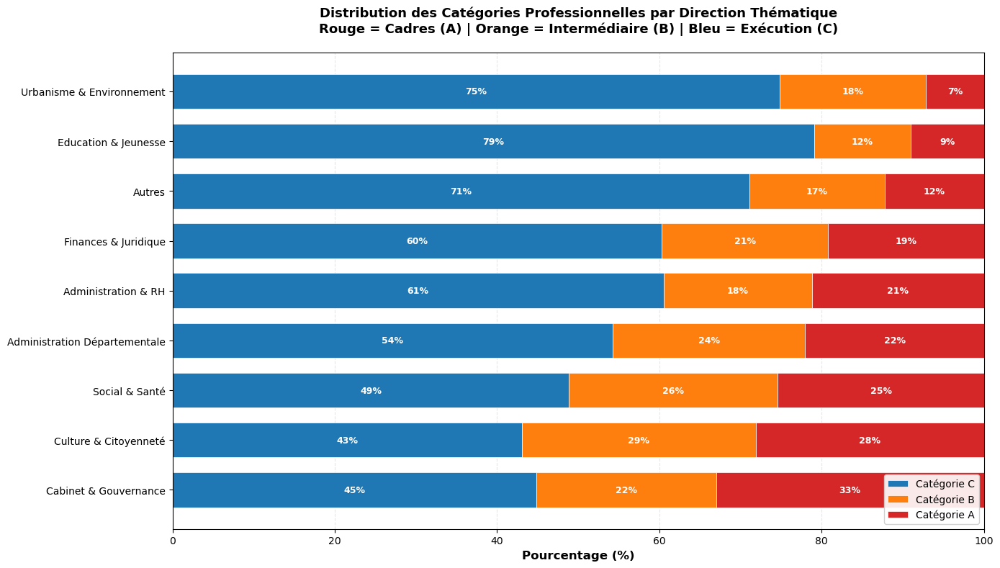


--- Directions avec le plus de catégorie A ---
  Cabinet & Gouvernance: 33.0%
  Culture & Citoyenneté: 28.1%
  Social & Santé: 25.4%
  Administration Départementale: 22.0%
  Administration & RH: 21.2%

--- Directions avec le plus de catégorie C ---
  Education & Jeunesse: 79.1%
  Urbanisme & Environnement: 74.8%
  Autres: 71.1%
  Administration & RH: 60.5%
  Finances & Juridique: 60.3%

✓ Analyse terminée


In [ ]:
# ANALYSE - CATÉGORIE PAR DIRECTION THÉMATIQUE

print("=" * 60)
print("ANALYSE CATÉGORIE × DIRECTION THÉMATIQUE")
print("=" * 60)

# Préparation des données
data_analyse = df[df['CATEGORIE'].isin(['A', 'B', 'C'])].copy()

# Tableau croisé
tableau_croise = pd.crosstab(
    data_analyse['DIRECTION_THEMATIQUE'], 
    data_analyse['CATEGORIE'],
    values=data_analyse['AGENT'],
    aggfunc='sum'
)

# Calculer les pourcentages par ligne
tableau_pct = tableau_croise.div(tableau_croise.sum(axis=1), axis=0) * 100

# Trier par proportion de catégorie A (descendant)
tableau_pct = tableau_pct.sort_values('A', ascending=False)

print("\n--- Distribution des catégories par direction (en %) ---")
print(tableau_pct.round(1).to_string())

# Créer le graphique
fig, ax = plt.subplots(figsize=(14, 8))

# Couleurs: A=rouge (cadres), B=orange (intermédiaire), C=bleu (exécution)
couleurs = {'A': '#d62728', 'B': '#ff7f0e', 'C': '#1f77b4'}

# Position des barres
x_pos = np.arange(len(tableau_pct))
largeur = 0.7

# Créer les barres empilées
bottom = np.zeros(len(tableau_pct))
for categorie in ['C', 'B', 'A']:  # Ordre inversé pour avoir A en haut
    valeurs = tableau_pct[categorie].values
    ax.barh(x_pos, valeurs, largeur, left=bottom, 
            label=f'Catégorie {categorie}', 
            color=couleurs[categorie],
            edgecolor='white',
            linewidth=0.5)
    
    # Ajouter les pourcentages sur les barres (si > 5%)
    for i, (val, bot) in enumerate(zip(valeurs, bottom)):
        if val > 5:  # Seulement si visible
            ax.text(bot + val/2, i, f'{val:.0f}%', 
                   ha='center', va='center', 
                   color='white', fontweight='bold', fontsize=9)
    
    bottom += valeurs

# Configuration des axes
ax.set_yticks(x_pos)
ax.set_yticklabels(tableau_pct.index, fontsize=10)
ax.set_xlabel('Pourcentage (%)', fontsize=12, fontweight='bold')
ax.set_xlim(0, 100)

# Titre et légende
ax.set_title('Distribution des Catégories Professionnelles par Direction Thématique\n' + 
             'Rouge = Cadres (A) | Orange = Intermédiaire (B) | Bleu = Exécution (C)',
             fontsize=13, fontweight='bold', pad=20)
ax.legend(loc='lower right', fontsize=10, framealpha=0.9)

# Grille légère
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Analyse complémentaire: directions les plus "élitistes"
print("\n--- Directions avec le plus de catégorie A ---")
top_A = tableau_pct['A'].sort_values(ascending=False).head(5)
for direction, pct in top_A.items():
    print(f"  {direction}: {pct:.1f}%")

print("\n--- Directions avec le plus de catégorie C ---")
top_C = tableau_pct['C'].sort_values(ascending=False).head(5)
for direction, pct in top_C.items():
    print(f"  {direction}: {pct:.1f}%")

print("\n✓ Analyse terminée")
print("=" * 60)

En suite nous allons observer l'évolution des directions thématiques entre 2014 et 2022. L'idée est de obtenir des directions renfercé au bout du temps et d'autres faiblies.

ÉVOLUTION DES DIRECTIONS THÉMATIQUES (2014-2022)

--- Effectifs par direction et année ---
DIRECTION_THEMATIQUE  Administration & RH  Administration Départementale   Autres  Cabinet & Gouvernance  Culture & Citoyenneté  Education & Jeunesse  Finances & Juridique  Social & Santé  Urbanisme & Environnement
DATE                                                                                                                                                                                                                  
2013                                  0.0                            0.0  42693.0                    0.0                    0.0                   0.0                   0.0             1.0                        0.0
2014                               1597.0                            4.0     48.0                  170.0                 4884.0                2550.0                8963.0         13675.0                    16790.0
2015                               1704.0        

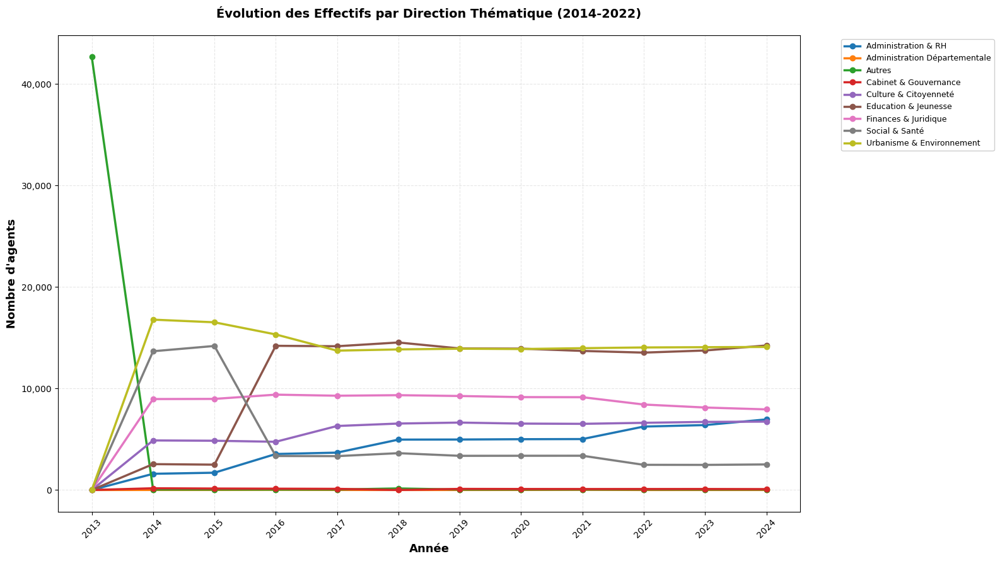


--- Analyse des variations 2014-2022 ---

Directions en forte baisse:
  Autres: -99.9%
  Social & Santé: 251900.0%
  Administration Départementale: inf%

Directions en forte hausse:
  Education & Jeunesse: inf%
  Finances & Juridique: inf%
  Urbanisme & Environnement: inf%

✓ Analyse temporelle terminée


In [ ]:
# ÉVOLUTION TEMPORELLE - DIRECTIONS THÉMATIQUES

print("=" * 60)
print("ÉVOLUTION DES DIRECTIONS THÉMATIQUES (2014-2022)")
print("=" * 60)

# Agrégation par année et direction thématique
evolution_direction = df.groupby(['DATE', 'DIRECTION_THEMATIQUE'])['AGENT'].sum().reset_index()

# Tableau pivot
pivot_direction = evolution_direction.pivot(
    index='DATE', 
    columns='DIRECTION_THEMATIQUE', 
    values='AGENT'
).fillna(0)

print("\n--- Effectifs par direction et année ---")
print(pivot_direction.to_string())

# Graphique
fig, ax = plt.subplots(figsize=(16, 9))

# Palette de couleurs distinctes
couleurs = plt.cm.tab10(range(len(pivot_direction.columns)))

# Tracer chaque direction
for i, direction in enumerate(pivot_direction.columns):
    ax.plot(pivot_direction.index, pivot_direction[direction], 
            marker='o', linewidth=2.5, markersize=6,
            label=direction, color=couleurs[i])

# Configuration
ax.set_xlabel('Année', fontsize=13, fontweight='bold')
ax.set_ylabel('Nombre d\'agents', fontsize=13, fontweight='bold')
ax.set_title('Évolution des Effectifs par Direction Thématique (2014-2022)',
             fontsize=14, fontweight='bold', pad=20)

# Grille
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Légende à droite
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', 
          fontsize=9, framealpha=0.95)

# Format des axes
ax.set_xticks(pivot_direction.index)
ax.set_xticklabels(pivot_direction.index, rotation=45)

# Format des nombres avec séparateurs de milliers
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

plt.tight_layout()
plt.show()

# Analyse des variations
print("\n--- Analyse des variations 2014-2022 ---")
variation = ((pivot_direction.iloc[-1] - pivot_direction.iloc[0]) / pivot_direction.iloc[0] * 100).sort_values()

print("\nDirections en forte baisse:")
for direction, pct in variation.head(3).items():
    print(f"  {direction}: {pct:.1f}%")

print("\nDirections en forte hausse:")
for direction, pct in variation.tail(3).items():
    print(f"  {direction}: {pct:.1f}%")

print("\n✓ Analyse temporelle terminée")
print("=" * 60)

Egalement nous allons obsever l'évolution temporelle par catégorie professionel par pourcentage et par nombre.

ÉVOLUTION DES CATÉGORIES PROFESSIONNELLES (2014-2022)

--- Effectifs par catégorie et année ---
CATEGORIE     A      B      C
DATE                         
2013       4820   7093  30565
2014       6425   9477  32600
2015       6475   9435  32780
2016       6783   9277  34539
2017       6901   9279  34278
2018       6882   9653  36353
2019       8622   7753  35728
2020       8713   7806  35371
2021       8670   8168  34930
2022       8714  12329  30341
2023       8960  12178  30539
2024       9139  12187  31311

--- Pourcentages par catégorie et année ---
CATEGORIE     A     B     C
DATE                       
2013       11.3  16.7  72.0
2014       13.2  19.5  67.2
2015       13.3  19.4  67.3
2016       13.4  18.3  68.3
2017       13.7  18.4  67.9
2018       13.0  18.3  68.7
2019       16.5  14.9  68.6
2020       16.8  15.0  68.2
2021       16.7  15.8  67.5
2022       17.0  24.0  59.0
2023       17.3  23.6  59.1
2024       17.4  23.2  59.5


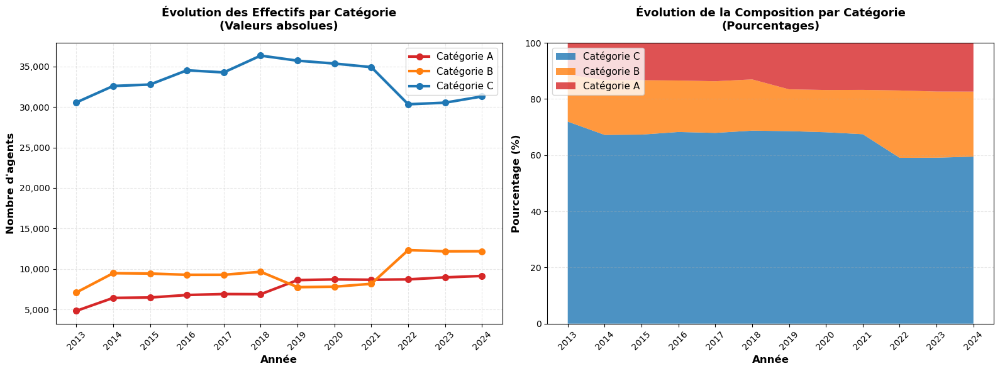


--- Analyse des tendances ---

Catégorie A: 4,820 → 9,139 (+89.6%)
Catégorie B: 7,093 → 12,187 (+71.8%)
Catégorie C: 30,565 → 31,311 (+2.4%)

✓ Analyse temporelle terminée


In [ ]:
# ÉVOLUTION TEMPORELLE - CATÉGORIES PROFESSIONNELLES

print("=" * 60)
print("ÉVOLUTION DES CATÉGORIES PROFESSIONNELLES (2014-2022)")
print("=" * 60)

# Filtrer seulement A, B, C
data_categories = df[df['CATEGORIE'].isin(['A', 'B', 'C'])].copy()

# Agrégation par année et catégorie
evolution_cat = data_categories.groupby(['DATE', 'CATEGORIE'])['AGENT'].sum().reset_index()

# Tableau pivot
pivot_cat = evolution_cat.pivot(
    index='DATE', 
    columns='CATEGORIE', 
    values='AGENT'
).fillna(0)

# Calculer les pourcentages
pivot_cat_pct = pivot_cat.div(pivot_cat.sum(axis=1), axis=0) * 100

print("\n--- Effectifs par catégorie et année ---")
print(pivot_cat.to_string())

print("\n--- Pourcentages par catégorie et année ---")
print(pivot_cat_pct.round(1).to_string())

# Créer deux graphiques côte à côte
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Couleurs cohérentes
couleurs = {'A': '#d62728', 'B': '#ff7f0e', 'C': '#1f77b4'}

# --- Graphique 1: Effectifs absolus ---
for categorie in ['A', 'B', 'C']:
    ax1.plot(pivot_cat.index, pivot_cat[categorie], 
             marker='o', linewidth=3, markersize=7,
             label=f'Catégorie {categorie}', 
             color=couleurs[categorie])

ax1.set_xlabel('Année', fontsize=12, fontweight='bold')
ax1.set_ylabel('Nombre d\'agents', fontsize=12, fontweight='bold')
ax1.set_title('Évolution des Effectifs par Catégorie\n(Valeurs absolues)',
              fontsize=13, fontweight='bold', pad=15)
ax1.legend(fontsize=11, loc='best')
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.set_xticks(pivot_cat.index)
ax1.set_xticklabels(pivot_cat.index, rotation=45)
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

# --- Graphique 2: Pourcentages (aire empilée) ---
ax2.stackplot(pivot_cat_pct.index, 
              pivot_cat_pct['C'], 
              pivot_cat_pct['B'], 
              pivot_cat_pct['A'],
              labels=['Catégorie C', 'Catégorie B', 'Catégorie A'],
              colors=[couleurs['C'], couleurs['B'], couleurs['A']],
              alpha=0.8)

ax2.set_xlabel('Année', fontsize=12, fontweight='bold')
ax2.set_ylabel('Pourcentage (%)', fontsize=12, fontweight='bold')
ax2.set_title('Évolution de la Composition par Catégorie\n(Pourcentages)',
              fontsize=13, fontweight='bold', pad=15)
ax2.legend(loc='upper left', fontsize=11)
ax2.grid(True, alpha=0.3, linestyle='--', axis='y')
ax2.set_xticks(pivot_cat_pct.index)
ax2.set_xticklabels(pivot_cat_pct.index, rotation=45)
ax2.set_ylim(0, 100)

plt.tight_layout()
plt.show()

# Analyse des tendances
print("\n--- Analyse des tendances ---")
print(f"\nCatégorie A: {pivot_cat['A'].iloc[0]:,.0f} → {pivot_cat['A'].iloc[-1]:,.0f} "
      f"({(pivot_cat['A'].iloc[-1] - pivot_cat['A'].iloc[0]) / pivot_cat['A'].iloc[0] * 100:+.1f}%)")
print(f"Catégorie B: {pivot_cat['B'].iloc[0]:,.0f} → {pivot_cat['B'].iloc[-1]:,.0f} "
      f"({(pivot_cat['B'].iloc[-1] - pivot_cat['B'].iloc[0]) / pivot_cat['B'].iloc[0] * 100:+.1f}%)")
print(f"Catégorie C: {pivot_cat['C'].iloc[0]:,.0f} → {pivot_cat['C'].iloc[-1]:,.0f} "
      f"({(pivot_cat['C'].iloc[-1] - pivot_cat['C'].iloc[0]) / pivot_cat['C'].iloc[0] * 100:+.1f}%)")

print("\n✓ Analyse temporelle terminée")
print("=" * 60)


Finalement, comme dernière analyse. Nous allons créer 4 charts pour determiner s'il y a une relation entre la pandemie en la distance de Paris. Prémièrement, on va utiliser une serie de temps avec la moyenne de distance par année. 
En suite, nous allons utiliser un graphique de poucentage pour les agents vivant dans paris et hors Paris au cours des annés. 
A près un boxplot avec la distance de Paris avant la pandemie et après la pandemie et finalement des barres avec le nombre total des agents qui ont une residence a plus de 50 kilometres de Paris. 

ANALYSE POST-COVID: TÉLÉTRAVAIL ET DISPERSION GÉOGRAPHIQUE

Années disponibles: [np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024)]

--- Distance moyenne de Paris par année ---
  2013: 28.42 km
  2014: 26.07 km
  2015: 26.23 km
  2016: 25.43 km
  2017: 25.47 km
  2018: 25.59 km
  2019: 25.74 km
  2020: 26.34 km ← COVID
  2021: 26.11 km
  2022: 25.69 km
  2023: 25.91 km
  2024: 25.75 km

--- Répartition PARIS vs HORS PARIS (%) ---
ZONE_SIMPLIFIEE  HORS PARIS  PARIS
DATE                              
2013                  61.15  38.85
2014                  61.55  38.45
2015                  61.27  38.73
2016                  62.38  37.62
2017                  62.48  37.52
2018                  62.26  37.74
2019                  62.83  37.17
2020                  63.30  36.70
2021                  63.13  36.87
2022                  63.09  36.91
2023 

C:\Users\dmerchan\AppData\Local\Temp\ipykernel_41164\3516169871.py:82: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



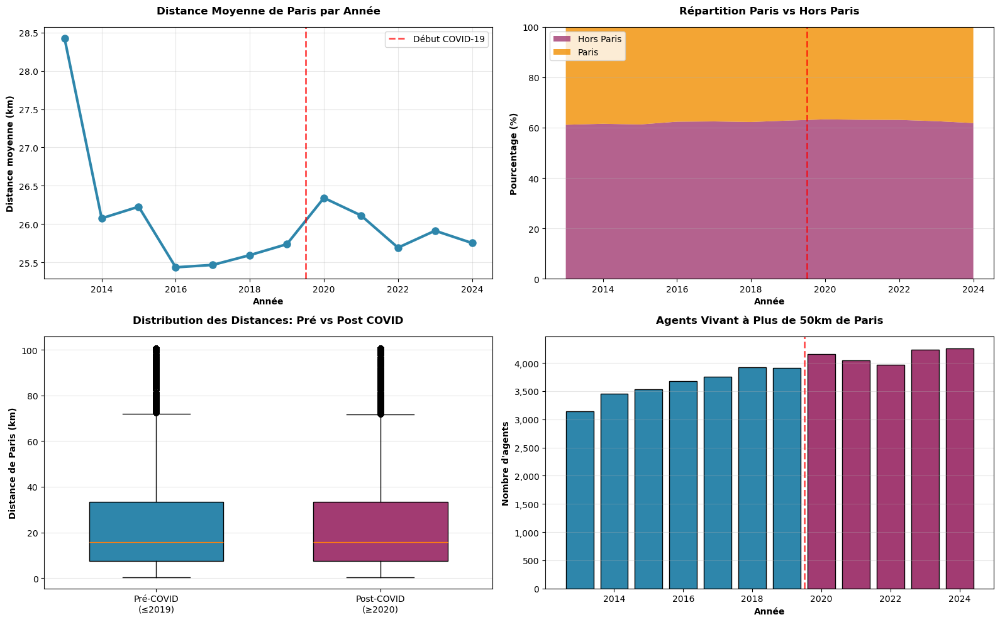


--- Analyse statistique ---

Variation distance moyenne 2019→2022: -0.18%
Variation 'Hors Paris' 2019→2022: +0.26 points de pourcentage

→ Pas de dispersion significative (rigidité du statut fonctionnaire?)

✓ Analyse post-COVID terminée


In [ ]:
# ANALYSE POST-COVID - DISPERSION GÉOGRAPHIQUE (2019-2022)

print("=" * 60)
print("ANALYSE POST-COVID: TÉLÉTRAVAIL ET DISPERSION GÉOGRAPHIQUE")
print("=" * 60)

# Vérifier les années disponibles
print(f"\nAnnées disponibles: {sorted(df['DATE'].unique())}")

# Filtrer période pré/post COVID
pre_covid = df[df['DATE'] <= 2019].copy()
post_covid = df[df['DATE'] >= 2020].copy()

if pre_covid.empty or post_covid.empty:
    print("\n⚠ Données insuffisantes pour l'analyse COVID")
else:
    # --- ANALYSE 1: Distance moyenne par année ---
    distance_annuelle = df.groupby('DATE')['DISTANCE_PARIS_KM'].mean()
    
    print("\n--- Distance moyenne de Paris par année ---")
    for annee, dist in distance_annuelle.items():
        marker = " ← COVID" if annee == 2020 else ""
        print(f"  {annee}: {dist:.2f} km{marker}")
    
    # --- ANALYSE 2: Distribution ZONE_SIMPLIFIEE ---
    zone_evolution = df.groupby(['DATE', 'ZONE_SIMPLIFIEE'])['AGENT'].sum().reset_index()
    zone_pivot = zone_evolution.pivot(index='DATE', columns='ZONE_SIMPLIFIEE', values='AGENT')
    zone_pct = zone_pivot.div(zone_pivot.sum(axis=1), axis=0) * 100
    
    print("\n--- Répartition PARIS vs HORS PARIS (%) ---")
    print(zone_pct.round(2).to_string())
    
    # --- ANALYSE 3: Top villes éloignées (>50km) ---
    villes_loin = df[df['DISTANCE_PARIS_KM'] > 50].groupby(['DATE', 'VILLE'])['AGENT'].sum().reset_index()
    
    print("\n--- Agents vivant à >50km de Paris ---")
    agents_loin = df[df['DISTANCE_PARIS_KM'] > 50].groupby('DATE')['AGENT'].sum()
    for annee, nb in agents_loin.items():
        print(f"  {annee}: {int(nb):,} agents")
    
    # --- GRAPHIQUES ---
    fig = plt.figure(figsize=(16, 10))
    
    # Graphique 1: Distance moyenne par année
    ax1 = plt.subplot(2, 2, 1)
    ax1.plot(distance_annuelle.index, distance_annuelle.values, 
             marker='o', linewidth=3, markersize=8, color='#2E86AB')
    ax1.axvline(x=2019.5, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Début COVID-19')
    ax1.set_xlabel('Année', fontweight='bold')
    ax1.set_ylabel('Distance moyenne (km)', fontweight='bold')
    ax1.set_title('Distance Moyenne de Paris par Année', fontweight='bold', pad=15)
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # Graphique 2: Évolution Paris vs Hors Paris (%)
    ax2 = plt.subplot(2, 2, 2)
    ax2.stackplot(zone_pct.index,
                  zone_pct['HORS PARIS'] if 'HORS PARIS' in zone_pct.columns else 0,
                  zone_pct['PARIS'] if 'PARIS' in zone_pct.columns else 0,
                  labels=['Hors Paris', 'Paris'],
                  colors=['#A23B72', '#F18F01'],
                  alpha=0.8)
    ax2.axvline(x=2019.5, color='red', linestyle='--', linewidth=2, alpha=0.7)
    ax2.set_xlabel('Année', fontweight='bold')
    ax2.set_ylabel('Pourcentage (%)', fontweight='bold')
    ax2.set_title('Répartition Paris vs Hors Paris', fontweight='bold', pad=15)
    ax2.legend(loc='upper left')
    ax2.set_ylim(0, 100)
    ax2.grid(True, alpha=0.3, axis='y')
    
    # Graphique 3: Distribution de distances (boxplot pré/post)
    ax3 = plt.subplot(2, 2, 3)
    
    # Préparer données pour boxplot
    pre_distances = pre_covid['DISTANCE_PARIS_KM'].dropna()
    post_distances = post_covid['DISTANCE_PARIS_KM'].dropna()
    
    bp = ax3.boxplot([pre_distances, post_distances],
                      labels=['Pré-COVID\n(≤2019)', 'Post-COVID\n(≥2020)'],
                      patch_artist=True,
                      widths=0.6)
    
    # Couleurs
    bp['boxes'][0].set_facecolor('#2E86AB')
    bp['boxes'][1].set_facecolor('#A23B72')
    
    ax3.set_ylabel('Distance de Paris (km)', fontweight='bold')
    ax3.set_title('Distribution des Distances: Pré vs Post COVID', fontweight='bold', pad=15)
    ax3.grid(True, alpha=0.3, axis='y')
    
    # Graphique 4: Agents à >50km (évolution)
    ax4 = plt.subplot(2, 2, 4)
    ax4.bar(agents_loin.index, agents_loin.values, 
            color=['#2E86AB' if x < 2020 else '#A23B72' for x in agents_loin.index],
            edgecolor='black', linewidth=1)
    ax4.axvline(x=2019.5, color='red', linestyle='--', linewidth=2, alpha=0.7)
    ax4.set_xlabel('Année', fontweight='bold')
    ax4.set_ylabel('Nombre d\'agents', fontweight='bold')
    ax4.set_title('Agents Vivant à Plus de 50km de Paris', fontweight='bold', pad=15)
    ax4.grid(True, alpha=0.3, axis='y')
    ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
    
    plt.tight_layout()
    plt.show()
    
    # --- ANALYSE STATISTIQUE ---
    print("\n--- Analyse statistique ---")
    
    variation_distance = ((distance_annuelle[2022] - distance_annuelle[2019]) / distance_annuelle[2019] * 100)
    print(f"\nVariation distance moyenne 2019→2022: {variation_distance:+.2f}%")
    
    if 'HORS PARIS' in zone_pct.columns:
        variation_hors_paris = zone_pct.loc[2022, 'HORS PARIS'] - zone_pct.loc[2019, 'HORS PARIS']
        print(f"Variation 'Hors Paris' 2019→2022: {variation_hors_paris:+.2f} points de pourcentage")
    
    # Test si la différence est notable
    if abs(variation_distance) > 2:
        print("\n→ Dispersion géographique détectable (>2%)")
    else:
        print("\n→ Pas de dispersion significative (rigidité du statut fonctionnaire?)")

print("\n✓ Analyse post-COVID terminée")
print("=" * 60)

### Text Mining - Analyse d'un Article de Presse

Nous analysons un article du Figaro portant sur les effectifs de la Ville de Paris. L'objectif est d'identifier les termes les plus utilisés dans le discours médiatique concernant la fonction publique territoriale parisienne.

Source : Le Figaro, "Une armée de 55 000 personnes : la mairie de Paris emploie-t-elle plus d'agents que toutes les préfectures de France réunies ?" (29 octobre 2024)

Nous allons commencer avec le chargement du texte

In [254]:
# ÉTAPE 1 : CHARGEMENT ET NETTOYAGE DE L'ARTICLE

import re
import requests
from bs4 import BeautifulSoup

print("=" * 60)
print("TEXT MINING - CHARGEMENT DE L'ARTICLE")
print("=" * 60)

# URL de l'article
url = "https://www.lefigaro.fr/actualite-france/une-armee-de-55-000-personnes-la-mairie-de-paris-emploie-t-elle-plus-d-agents-que-toutes-les-prefectures-de-france-reunies-20241029"

print(f"\nChargement de l'article depuis Le Figaro...")

try:
    # Télécharger la page
    response = requests.get(url, timeout=10)
    response.raise_for_status()
    
    # Parser le HTML
    soup = BeautifulSoup(response.content, 'html.parser')
    
    # Extraire le texte des paragraphes (ajuster selon structure du site)
    paragraphes = soup.find_all('p')
    texte_brut = ' '.join([p.get_text() for p in paragraphes])
    
    print(f"✓ Article téléchargé ({len(texte_brut)} caractères)")
    
except Exception as e:
    print(f"✗ Erreur de téléchargement: {e}")
    print("\nUtilisation d'un extrait de l'article...")
    
    # Extrait manuel (au cas où le téléchargement échoue)
    texte_brut = """
    Une armée de 55 000 personnes : la mairie de Paris emploie-t-elle plus d'agents 
    que toutes les préfectures de France réunies ? Les effectifs de la Ville de Paris 
    sont régulièrement pointés du doigt. La capitale compte environ 55 000 agents, 
    un chiffre qui interpelle. La fonction publique territoriale parisienne représente 
    un budget considérable pour la collectivité. Les syndicats défendent ces effectifs 
    en soulignant la diversité des services publics offerts aux Parisiens. 
    Entre gestion des écoles, des espaces verts, de la voirie, et des équipements 
    culturels et sportifs, les besoins en personnel sont importants. Cependant, 
    certains élus et observateurs estiment que ces effectifs pourraient être rationalisés.
    """

# Afficher un aperçu
print("\n--- Aperçu du texte brut (300 premiers caractères) ---")
print(texte_brut[:300] + "...")

# --- NETTOYAGE DU TEXTE ---

print("\n--- Nettoyage du texte ---")

# 1. Mettre en minuscules
texte_propre = texte_brut.lower()
print("✓ Conversion en minuscules")

# 2. Supprimer les URLs (si présentes)
texte_propre = re.sub(r'http\S+|www\S+', '', texte_propre)
print("✓ URLs supprimées")

# 3. Supprimer les caractères spéciaux et la ponctuation
# On garde seulement les lettres (y compris accents français)
texte_propre = re.sub(r'[^a-zàâäéèêëïîôùûüÿçœæ\s]', ' ', texte_propre)
print("✓ Ponctuation supprimée")

# 4. Supprimer les espaces multiples
texte_propre = re.sub(r'\s+', ' ', texte_propre).strip()
print("✓ Espaces normalisés")

# Afficher résultat
print("\n--- Aperçu du texte nettoyé (300 premiers caractères) ---")
print(texte_propre[:300] + "...")

print(f"\nLongueur avant nettoyage : {len(texte_brut)} caractères")
print(f"Longueur après nettoyage : {len(texte_propre)} caractères")

print("\n✓ Nettoyage terminé")
print("=" * 60)

TEXT MINING - CHARGEMENT DE L'ARTICLE

Chargement de l'article depuis Le Figaro...
✓ Article téléchargé (4883 caractères)

--- Aperçu du texte brut (300 premiers caractères) ---
 Rubriques et services du Figaro  Nos journaux et magazines Les sites du Groupe Figaro 
LA VÉRIFICATION - «Est-ce que Madame Hidalgo a besoin d'une [telle] armée à son service?», s’est récemment demandé Sarah Knafo. La députée européenne Reconquête évoque les chiffres respectifs de 55.000 et 30.000 ...

--- Nettoyage du texte ---
✓ Conversion en minuscules
✓ URLs supprimées
✓ Ponctuation supprimée
✓ Espaces normalisés

--- Aperçu du texte nettoyé (300 premiers caractères) ---
rubriques et services du figaro nos journaux et magazines les sites du groupe figaro la vérification est ce que madame hidalgo a besoin d une telle armée à son service s est récemment demandé sarah knafo la députée européenne reconquête évoque les chiffres respectifs de et agents publics le chiffre ...

Longueur avant nettoyage : 4883 cara



Tokenisation pour découper le texte en mots individuels. Ensuite, nous supprimons les "stopwords" (mots vides comme "le", "la", "de") qui n'apportent pas de sens particulier à l'analyse.

In [255]:
# ÉTAPE 2 : TOKENISATION ET SUPPRESSION DES STOPWORDS

from collections import Counter

print("=" * 60)
print("TOKENISATION ET FILTRAGE")
print("=" * 60)

# --- TOKENISATION ---

print("\n--- Tokenisation (découpage en mots) ---")

# Découper le texte en mots individuels
mots = texte_propre.split()

print(f"✓ Nombre de mots : {len(mots)}")

# Afficher les 20 premiers mots
print("\nPremiers mots :")
print(mots[:20])

# --- STOPWORDS (mots vides à supprimer) ---

print("\n--- Suppression des stopwords ---")

# Liste des mots vides en français (les plus courants)
stopwords = {
    'le', 'la', 'les', 'un', 'une', 'des', 'de', 'du', 'et', 'en', 'dans',
    'pour', 'par', 'sur', 'avec', 'sans', 'sous', 'au', 'aux', 'ce', 'ces',
    'cette', 'cet', 'son', 'sa', 'ses', 'qui', 'que', 'quoi', 'dont', 'où',
    'est', 'sont', 'était', 'étaient', 'être', 'avoir', 'ont', 'a', 'fait',
    'plus', 'peut', 'comme', 'mais', 'ou', 'donc', 'car', 'si', 'ne', 'pas',
    'lui', 'nous', 'vous', 'eux', 'elle', 'elles', 'il', 'ils', 'on', 'aussi',
    'tout', 'tous', 'toute', 'toutes', 'même', 'autres', 'autre', 'très',
    'bien', 'encore', 'alors', 'ainsi', 'après', 'avant', 'déjà', 'depuis',
    'pendant', 'chez', 'été', 'été', 'faire', 'dit', 'deux', 'trois'
}

# Filtrer : garder seulement les mots qui ne sont PAS dans les stopwords
# ET qui ont plus de 3 lettres (éviter "oui", "non", etc.)
mots_filtres = []
for mot in mots:
    if mot not in stopwords and len(mot) > 3:
        mots_filtres.append(mot)

print(f"✓ Mots avant filtrage : {len(mots)}")
print(f"✓ Mots après filtrage : {len(mots_filtres)}")
print(f"  ({len(mots) - len(mots_filtres)} mots supprimés)")

# --- COMPTAGE DES FRÉQUENCES ---

print("\n--- Analyse des fréquences ---")

# Compter combien de fois chaque mot apparaît
compteur = Counter(mots_filtres)

# Les 20 mots les plus fréquents
top_20 = compteur.most_common(20)

print("\nTop 20 des mots les plus fréquents :")
for position, (mot, frequence) in enumerate(top_20, 1):
    print(f"  {position:2d}. {mot:20s} → {frequence:3d} fois")

print("\n✓ Analyse des fréquences terminée")
print("=" * 60)

TOKENISATION ET FILTRAGE

--- Tokenisation (découpage en mots) ---
✓ Nombre de mots : 745

Premiers mots :
['rubriques', 'et', 'services', 'du', 'figaro', 'nos', 'journaux', 'et', 'magazines', 'les', 'sites', 'du', 'groupe', 'figaro', 'la', 'vérification', 'est', 'ce', 'que', 'madame']

--- Suppression des stopwords ---
✓ Mots avant filtrage : 745
✓ Mots après filtrage : 367
  (378 mots supprimés)

--- Analyse des fréquences ---

Top 20 des mots les plus fréquents :
   1. paris                →   5 fois
   2. personnes            →   5 fois
   3. figaro               →   4 fois
   4. ville                →   4 fois
   5. armée                →   3 fois
   6. mois                 →   3 fois
   7. près                 →   3 fois
   8. hôtel                →   3 fois
   9. madame               →   2 fois
  10. hidalgo              →   2 fois
  11. besoin               →   2 fois
  12. service              →   2 fois
  13. sarah                →   2 fois
  14. knafo                →   2 fo

En suite on va génerer le nuage de mots clés qui permet de visualiser rapidement les termes les plus importants de l'article.

GÉNÉRATION DU WORDCLOUD

Texte pour le WordCloud : 367 mots

--- Création du nuage de mots ---
✓ WordCloud généré

--- Affichage du nuage de mots ---


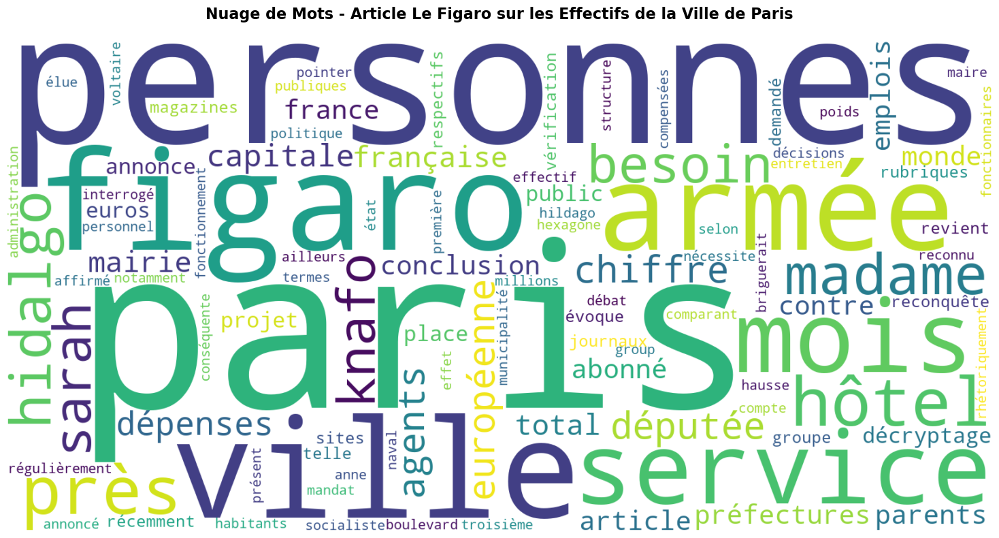


✓ WordCloud sauvegardé : wordcloud_article_lefigaro.png

✓ Text mining terminé


In [ ]:
# ÉTAPE 3 : GÉNÉRATION DU WORDCLOUD

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

print("=" * 60)
print("GÉNÉRATION DU WORDCLOUD")
print("=" * 60)

# Reconstruire le texte à partir des mots filtrés
texte_final = ' '.join(mots_filtres)

print(f"\nTexte pour le WordCloud : {len(mots_filtres)} mots")

# --- CRÉATION DU WORDCLOUD ---

print("\n--- Création du nuage de mots ---")

# Créer le WordCloud
nuage = WordCloud(
    width=1600,                    # Largeur de l'image
    height=800,                    # Hauteur de l'image
    background_color='white',      # Fond blanc
    colormap='viridis',            # Palette de couleurs (bleu-vert-jaune)
    max_words=100,                 # Maximum 100 mots
    relative_scaling=0.5,          # Taille relative des mots
    min_font_size=10               # Taille minimale des mots
).generate(texte_final)

print("✓ WordCloud généré")

# --- AFFICHAGE ---

print("\n--- Affichage du nuage de mots ---")

# Créer la figure
fig, ax = plt.subplots(figsize=(16, 8))

# Afficher le nuage
ax.imshow(nuage, interpolation='bilinear')
ax.axis('off')  # Masquer les axes

# Titre
ax.set_title(
    'Nuage de Mots - Article Le Figaro sur les Effectifs de la Ville de Paris',
    fontsize=16, 
    fontweight='bold', 
    pad=20
)

plt.tight_layout()
plt.show()

# --- SAUVEGARDE ---

# Vérifier si le fichier existe et le supprimer
fichier_output = 'wordcloud_article_lefigaro.png'

if os.path.exists(fichier_output):
    os.remove(fichier_output)
    print(f"\n⚠ Ancien fichier '{fichier_output}' supprimé")

# Sauvegarder l'image
nuage.to_file(fichier_output)
print(f"\n✓ WordCloud sauvegardé : {fichier_output}")

print("\n✓ Text mining terminé")
print("=" * 60)